In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import datetime
from res_sweep import process, fit, measure

# Instruments

## qblox

In [2]:
from qblox_esr import simple_convert_q1asm
from qblox_instruments import Cluster
from qblox_esr import qblox_esr
from qblox_esr.data_treatment import echo_data_treatment, auto_0th_ph_corr

In [3]:
from qblox_instruments import Cluster
from qblox_esr import qblox_esr
from qblox_esr.data_treatment import echo_data_treatment, auto_0th_ph_corr
from textwrap import dedent

# connect to QBLOX and QRM-RF on slot 6, run time ~5-10s
cluster = qblox_esr.connect2cluster("cluster-mm")  # warning can be safely ignored
qrm_rf = qblox_esr.connect2module(cluster, slot_nb=2)  # expected print: Status: OKAY, Flags: NONE, Slot flags: NONE
cluster.start_adc_calib(2)

C:\ProgramData\miniconda3\envs\qcodes-res\lib\site-packages\qcodes\instrument\instrument_base.py:642: UserWarning: Changed cluster-mm to cluster_mm for instrument identifier
  warnings.warn(f"Changed {name} to {new_name} for instrument identifier")


cluster-mm connected at 192.168.0.2
QRM-RF connected
Status: OKAY, Flags: NONE, Slot flags: NONE


In [4]:
def get_data():
    # get data
    single_acq = qblox_esr.get_scope_acq_0(qrm_rf, "single", timeout=1000)
    
    data_i = np.array(single_acq["single"]["acquisition"]["scope"]["path0"]["data"])
    data_q = np.array(single_acq["single"]["acquisition"]["scope"]["path1"]["data"])

    return data_i + 1j*data_q

def get_data_int(integ_len=None):
    # get data
    single_acq = qblox_esr.get_scope_acq_0(qrm_rf, "single", timeout=1000)
    
    data_i = np.array(single_acq["single"]['acquisition']['bins']['integration']['path0'])
    data_q = np.array(single_acq["single"]['acquisition']['bins']['integration']['path1'])

    if integ_len is not None:

        norm_factor = integ_len / np.sqrt(2)
        data_i /= norm_factor
        data_q /= norm_factor

    return data_i + 1j*data_q

## switch VNA/SPEC

In [5]:
from res_drivers.Tenma2535 import Tenma722535  # TODO: put in res_drivers or 

def VNA_mode():
    tenma.set_voltage(12)

def SPEC_mode():
    tenma.set_voltage(0)


tenma = Tenma722535('COM3')  # switch power supply
print('Connected to Tenma')
tenma.set_voltage(0)
tenma.set_output(True)

Connected to Tenma


In [6]:
# SPEC_mode()
# VNA_mode()

## VNA

In [7]:
from res_sweep import measure, process, fit
from res_drivers.CobaltC2209 import CobaltC2209

ip = '127.0.0.1';
vna = CobaltC2209('VNA','TCPIP0::'+ip+'::5025::SOCKET')

Connected to: CMT C2209 (serial:18036105, firmware:25.3.3/2) in 0.15s


## field

In [8]:
from qcodes.instrument_drivers.american_magnetics import AMIModel430, AMIModel4303D

# connect to 3 magnet coils
# NB: increased timeout to avoid timeout error (was at 5s)
# could be fixed by new driver which automatically retries getting the value
# to see that value, use print(ix.get('timeout'))  # Explicit getter
ix = AMIModel430("x", address="TCPIP0::169.254.199.2::7180::SOCKET", timeout=10);
iy = AMIModel430("y", address="TCPIP0::169.254.199.1::7180::SOCKET", timeout=10);
iz = AMIModel430("z", address="TCPIP0::169.254.199.0::7180::SOCKET", timeout=10);

field_limit = [lambda x, y, z: x == 0 and y == 0 and z < 3,
               lambda x, y, z: np.linalg.norm([x, y, z]) < 3]
i3d = AMIModel4303D('AMI430_3D', ix, iy, iz,
                    field_limit = field_limit)

Connected to: AMERICAN MAGNETICS INC. 430 (serial:170059, firmware:2.58) in 6.07s
Connected to: AMERICAN MAGNETICS INC. 430 (serial:170060, firmware:2.58) in 5.90s
Connected to: AMERICAN MAGNETICS INC. 430 (serial:170061, firmware:2.58) in 6.04s


In [9]:
magnet = (ix, iy, iz, i3d)

In [10]:
measure.get_magnetic_field(magnet, magnet_type="AM1430")

np.float64(106.80322012547185)

In [9]:
# check stability
for i in range(5):
    print(measure.get_magnetic_field(magnet, magnet_type="AM1430"))
    time.sleep(5)

11.400202630216711
11.40243684876176
11.398687799040731
11.401877149399565
11.396983521090132


In [10]:
theta = 96.5  # go on +x
phi = -1.116
magnet_options = {"phi": phi, "theta": theta, "step":1}
_ = measure.set_magnetic_field(magnet, 106.8, magnet_type="AM1430", sleep_time=15, options=magnet_options)

Starting at field 106.80mT
Setting field to 106.80mT


# Resonator

In [12]:
VNA_mode()

S21 trace recorded in 48s, now displayed on VNA.



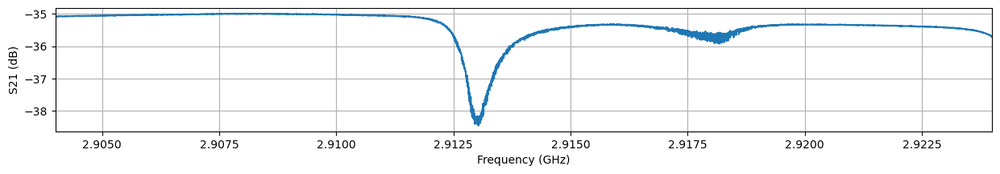

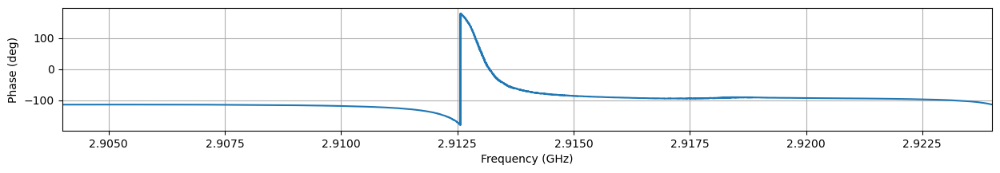

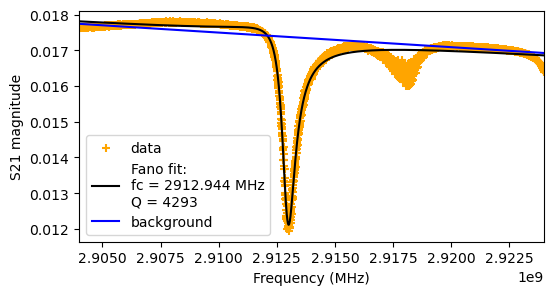

fc = 2912.944±0.002 MHz
Q = 4293±28
Linewidth = 0.679±0.004 MHz
R2 = 96.51%
Suggested guess values for next fit (values of current fit):
fc0=2.912944e+09, sigma0=6.79e+05, amp0=5.26e-03, q0=-1.92e-01



In [13]:
f_centre = 2.914e+09  # Hz
span = 10e6
sweep = [f_centre-span, f_centre+span]
f_pts = 4000

mag, ph, metadata, filename = measure.VNA_sweep(vna, sweep[0], sweep[1], f_pts, bandwidth=100, power=-10,
                                                elec_delay=90e-9, coeff='S21', plot=True, save=False,
                                                folder='data', filename=None, comments=None)

freq = np.linspace(sweep[0], sweep[1], f_pts)
fc, Ql, fit_res = fit.fit_Fano(freq, mag, fcrop=None, background=True,
                               fc0="min", sigma0=2e6, amp0=0.01, q0=0,
                               plot=True, verbose=True)

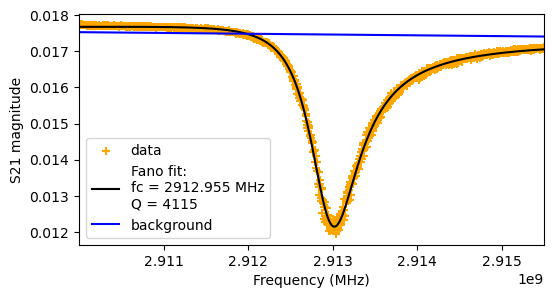

fc = 2912.955±0.001 MHz
Q = 4115±13
Linewidth = 0.708±0.002 MHz
R2 = 99.76%
Suggested guess values for next fit (values of current fit):
fc0=2.912955e+09, sigma0=7.08e+05, amp0=5.32e-03, q0=-1.76e-01



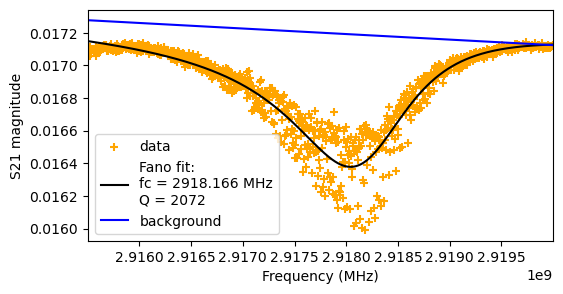

fc = 2918.166±0.025 MHz
Q = 2072±55
Linewidth = 1.408±0.037 MHz
R2 = 89.09%
Suggested guess values for next fit (values of current fit):
fc0=2.918166e+09, sigma0=1.41e+06, amp0=8.13e-04, q0=1.92e-01



In [15]:
fc, Ql, fit_res = fit.fit_Fano(freq, mag, fcrop=[2.9100e9, 2.9155e9], background=True,
                               fc0="min", sigma0=2e6, amp0=0.1, q0=0,
                               plot=True, verbose=True)

fc, Ql, fit_res = fit.fit_Fano(freq, mag, fcrop=[2.9155e9, 2.9200e9], background=True,
                               fc0="min", sigma0=2e6, amp0=0.01, q0=0,
                               plot=True, verbose=True)

S21 trace recorded in 5s, now displayed on VNA.



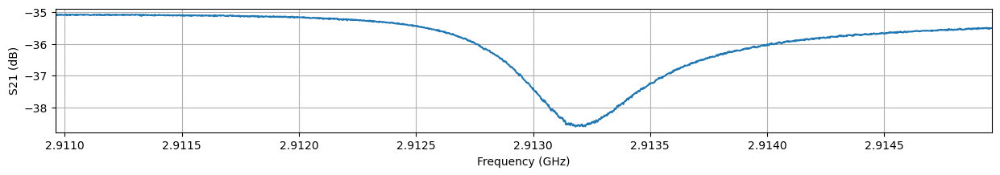

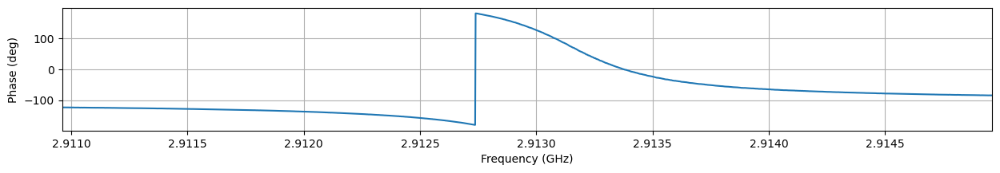

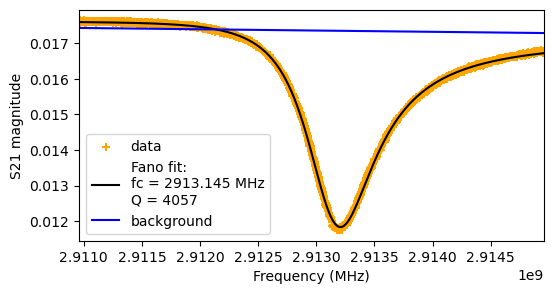

fc = 2913.145±0.000 MHz
Q = 4057±5
Linewidth = 0.718±0.001 MHz
R2 = 99.95%
Suggested guess values for next fit (values of current fit):
fc0=2.913145e+09, sigma0=7.18e+05, amp0=5.50e-03, q0=-1.73e-01



In [16]:
f_centre = 2.91296e+09  # Hz
span = 2e6
sweep = [f_centre-span, f_centre+span]
f_pts = 2000

mag, ph, metadata, filename = measure.VNA_sweep(vna, sweep[0], sweep[1], f_pts, bandwidth=500, power=-10,
                                                elec_delay=90e-9, coeff='S21', plot=True, save=False,
                                                folder='data', filename=None, comments=None)

freq = np.linspace(sweep[0], sweep[1], f_pts)
fc, Ql, fit_res = fit.fit_Fano(freq, mag, fcrop=None, background=True,
                               fc0="min", sigma0=2e6, amp0=0.01, q0=0,
                               plot=True, verbose=True)

In [11]:
fc = 2912.96e6

# Spectrometer

In [42]:
# minimum attenuation on qblox at 10dB (max. the HEMT can take -10dBm)

In [12]:
SPEC_mode()

In [13]:
freq_pulse = fc  # frequency at which you're pulsing (Hz)
nco_f = 100e6  # Numerically Controlled Oscillator frequency (Hz)
qblox_esr.qrm_rf_awg(qrm_rf, lo_freq=freq_pulse-nco_f, nco_freq=nco_f, in0_att=0, out0_att=10)

# needs to be executed after setting up LO (but not necessary to execute again if changing frequency
qrm_rf.out0_in0_lo_cal()
qrm_rf.sequencer0.sideband_cal()
cluster.start_adc_calib(2)

In [14]:
def acquire_int(npts=1000, tres=300):
    """
    Acquire integrated values in succession
    
    Parameters
    ----------
    npts: int
        number of points to be integrated
    tres: int
        time resolution, i.e. duration of each integration (ns)

    Returns
    -------
    prog: str
        program with transformed acquire instruction which is looped over

    Notes
    -----
    Default bandwidth of 3.33MHz.
    Normalize by tres (integration length) and sqrt(2) to find same voltage
    as scope acquisition.
    Requires later conversion of the for loop.
    """
    
    assert tres >= 300, 'tres of acquire_int should be >300ns.'
    
    prog = dedent(f"""
    for R4 in 0,1,{npts-1}
        nop
        acquire 0,R4,{tres}
    end
    """).lstrip('\n') # lstrip gets rid of leading character

    return prog.rstrip()


def hahnecho(amp, len_pi_over_2, len_pi, tau, rec_del,
             avg_nb=1, steps=None, ctp=None, dummy_nb=0,
             acq_pos=-4000, acq_npts=1000, acq_tres=300, scope=False):
    
    waveforms = {
        "block1": {"data": [float(amp) for i in range(0, len_pi_over_2)], "index": 1},
        "block2": {"data": [float(amp) for i in range(0, len_pi)], "index": 2},
    }

    if scope:
        acquire = 'acquire 0,0,4'
        rec_del -= (rec_del+acq_pos+154)
        acq_npts = 1
    else:
        acquire = acquire_int(npts=acq_npts, tres=acq_tres)  # 300us by default
        rec_del -= (acq_pos+150+acq_npts*acq_tres)

    acquisitions = {
        "single": {"num_bins": acq_npts, "index": 0},
    }

    prog = dedent(f"""
    set_mrk(t1t2t3t4=0110)  # close internal qblox switch output
    upd_param 200
    play      1,1,{len_pi_over_2}   # play excitation waveform and wait its duration
    wait      {tau}
    play      2,2,{len_pi}   # play refocusing waveform and wait its duration
    wait      100
    set_mrk(t1t2t3t4=0100)  # open switch output
    upd_param 8
    wait      {tau+acq_pos+150-8-100}
    {acquire}
    wait   {rec_del}
    """).lstrip('\n')

    seq_prog, wfs = qblox_esr.simple2real_Q1ASM(
                                prog, avg_nb=avg_nb, shot_nb=1, dummy_nb=dummy_nb,
                                steps=steps, ctp=ctp, twt_triggers=False, waveforms=waveforms)
    
    sequence = {
        "waveforms": wfs,
        "weights": {},
        "acquisitions": acquisitions,
        "program": seq_prog,
    }

    return sequence

## ringdown

In [15]:
def setup_ringdown(amp, len_pi_over_2, len_pi, tau, rec_del, avg_nb=1, acq_pos=0, steps=None, ctp=None, dummy_nb=0):

    waveforms = {
        "block01": {"data": [float(amp) for i in range(0, len_pi_over_2)], "index": 2},
        "block02": {"data": [float(amp) for i in range(0, len_pi)], "index": 3},
    }

    acquisitions = {
        "single": {"num_bins": 1, "index": 0},
    }

    prog = dedent(f"""
    wait       200
    acquire   0,0,4
    set_mrk(t1t2t3t4=0110)  # on QRM-RF, t1t2t3t4=O1I1M1M2
    upd_param 400
    play      2,2,{len_pi_over_2}   # play excitation waveform and wait its duration
    wait      {tau}
    play      3,3,{len_pi} # play refocusing waveform and wait its duration
    wait      {tau}
    wait      {rec_del}
    """).lstrip('\n')

    seq_prog = qblox_esr.simple2real_Q1ASM(
                                prog, avg_nb=avg_nb, shot_nb=1, dummy_nb=dummy_nb,
                                steps=steps, ctp=ctp, twt_triggers=False)

    sequence = {
        "waveforms": waveforms,
        "weights": {},
        "acquisitions": acquisitions,
        "program": seq_prog,
    }

    return sequence

In [16]:
freq_pulse = fc-0e6 # frequency at which you're pulsing (Hz)
nco_f = 100e6 # Numerically Controlled Oscillator frequency (Hz)

In [17]:
amp = 1
len_pi_over_2 = int(2e3)
len_pi = 2*len_pi_over_2
tau = int(4e3)
rec_del = int(1e9)
avg_nb = 1
dummy_nb = 0
steps=None
ctp=None

In [18]:
sequence = setup_ringdown(amp, len_pi_over_2, len_pi, tau, rec_del, avg_nb=avg_nb, steps=None, ctp=None, dummy_nb=dummy_nb)
qblox_esr.qrm_rf_awg(qrm_rf, lo_freq=freq_pulse-nco_f, nco_freq=nco_f, in0_att=0, out0_att=20)
qrm_rf.sequencer0.nco_prop_delay_comp_en(True)

qblox_esr.config_acq(qrm_rf, integ_len=20000)
qrm_rf.sequencer0.sequence(sequence)

In [19]:
qrm_rf.arm_sequencer(0)
qrm_rf.start_sequencer()
data = get_data()

Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


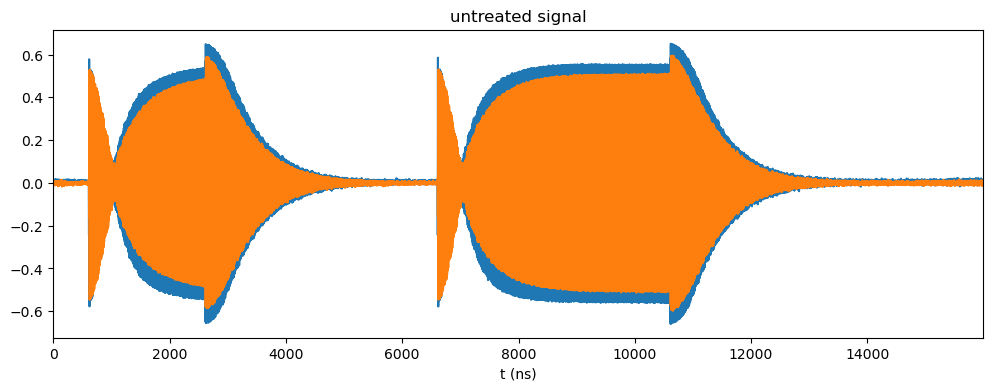

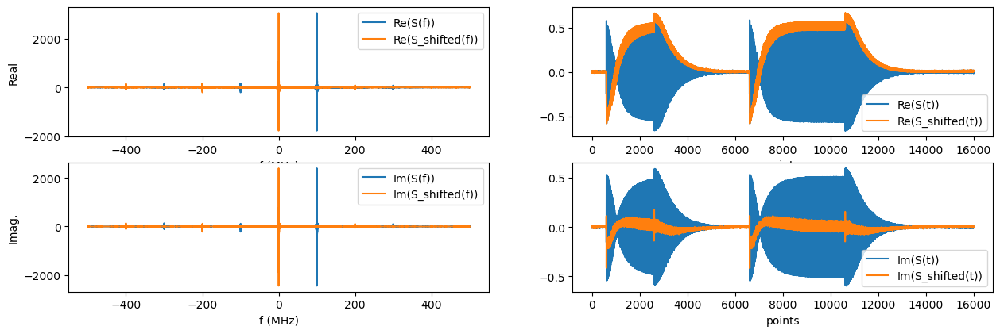

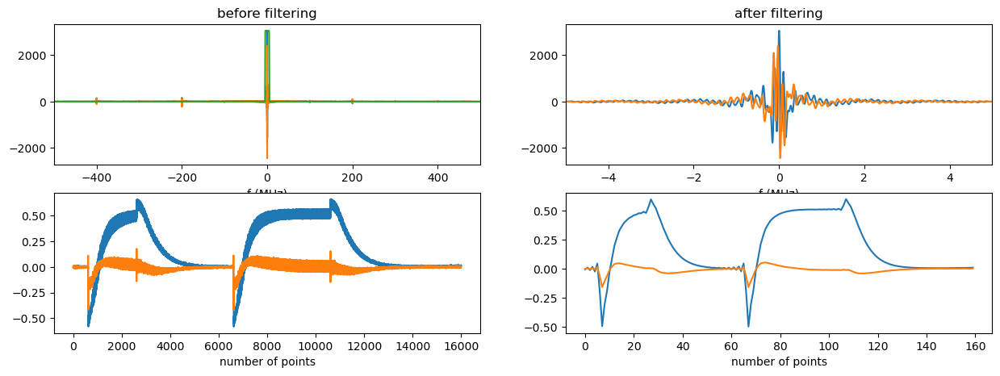

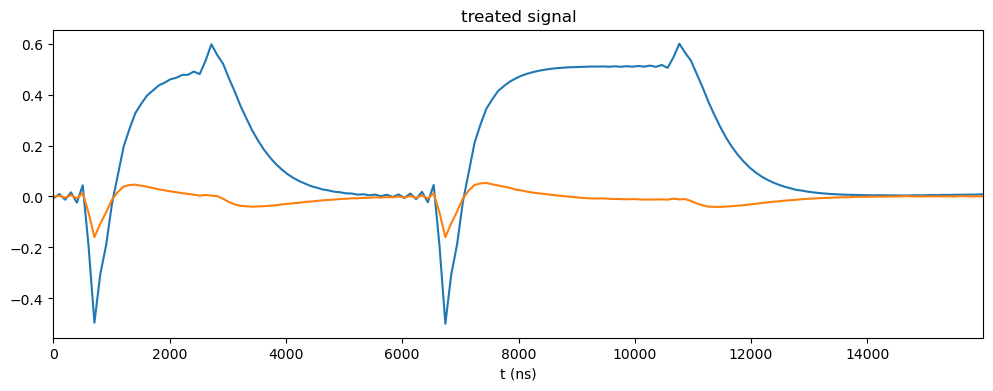

In [20]:
result_on_res = echo_data_treatment(data, 0, 16000, tres=1e-9,
                                    baseline=True, baseline_start=-300, baseline_stop=-1,
                                    freq_shift=-nco_f,
                                    filt=True, filt_opt={'bandwidth':10e6, 'centre':0e6},
                                    ph_corr=False,
                                    plot=True,
                                    plot_dem_filt=True)

# Echo

## scope

In [21]:
freq_pulse = fc
nco_f = 100e6

In [4]:
# T1 on the order of minutes?

Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


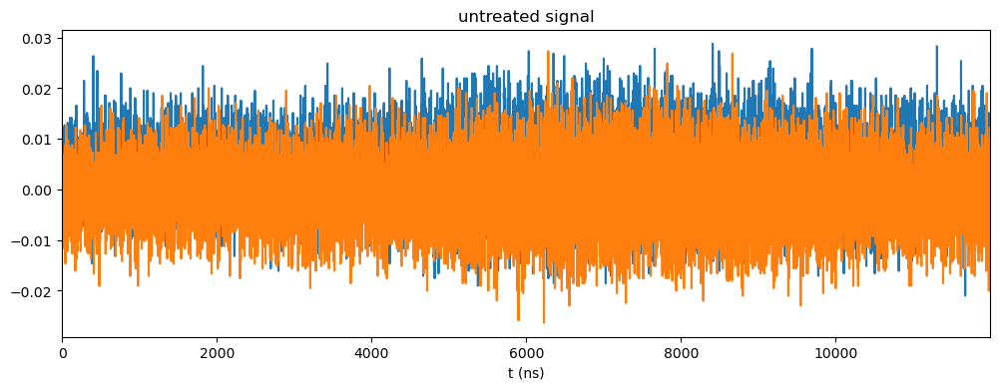

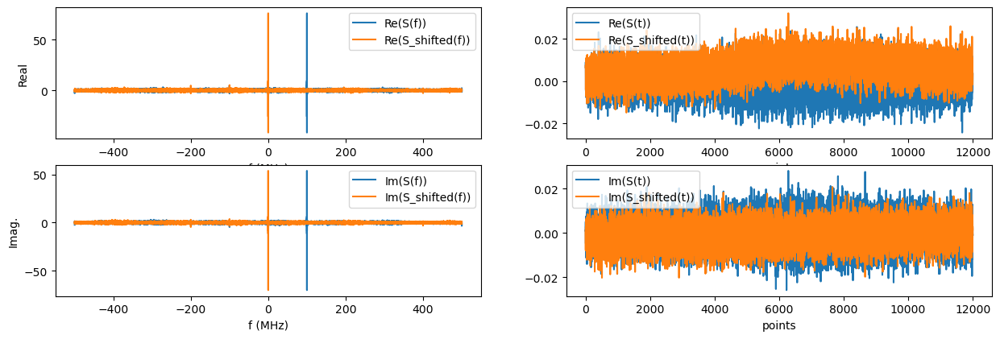

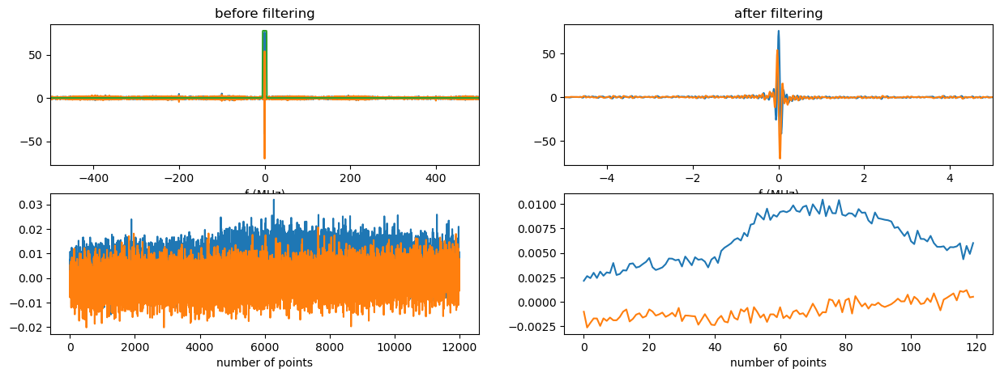

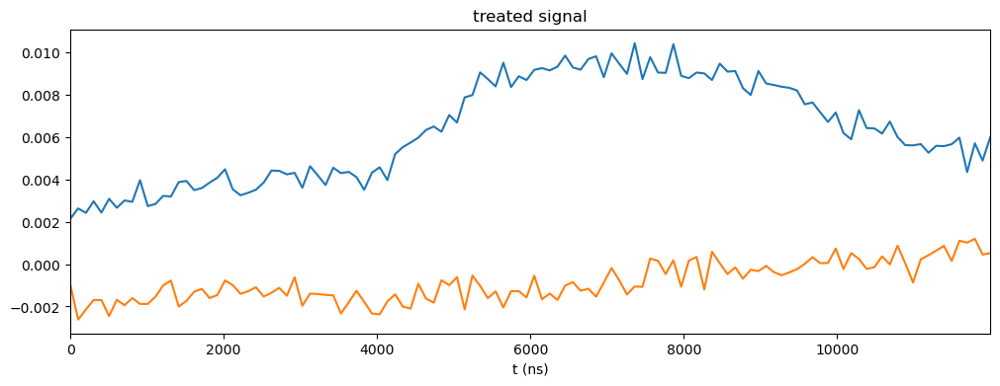

In [22]:
attenuation = 20
amp = 1
len_pi_over_2 = int(4e3)
len_pi = 2*len_pi_over_2
tau = int(30e3)
rec_del = int(1e9)
avg_nb = 1
dummy_nb = 0
steps=None
ctp=None
sequence = hahnecho(amp, len_pi_over_2, len_pi, tau, rec_del, avg_nb=avg_nb, acq_pos=-4000, steps=None, ctp=None, dummy_nb=dummy_nb, scope=True)
qblox_esr.qrm_rf_awg(qrm_rf, lo_freq=freq_pulse-nco_f, nco_freq=nco_f, in0_att=0, out0_att=int(attenuation))
qrm_rf.sequencer0.nco_prop_delay_comp_en(True)

qblox_esr.config_acq(qrm_rf, integ_len=8000)
qrm_rf.sequencer0.sequence(sequence) 
qrm_rf.arm_sequencer(0)
qrm_rf.start_sequencer()
data = get_data()
data_int = get_data_int()
result_on_res = echo_data_treatment(data, 0, 12000, tres=1e-9,
                                    baseline=True, baseline_start=-300, baseline_stop=-1,
                                    freq_shift=-nco_f,
                                    filt=True, filt_opt={'bandwidth':10e6, 'centre':0e6},
                                    ph_corr=False,
                                    plot=True,
                                    plot_dem_filt=True)

## integrated acquire

In [23]:
attenuation = 20
amp = 1
len_pi_over_2 = int(12e3)
len_pi = 2*len_pi_over_2
tau = int(40e3)
rec_del = int(10e9)
avg_nb = 1
dummy_nb = 0
steps=None
ctp=None
acq_tres = 300
sequence = hahnecho(amp, len_pi_over_2, len_pi, tau, rec_del, avg_nb=avg_nb, acq_pos=-38000, steps=None, ctp=None, dummy_nb=dummy_nb, acq_tres=acq_tres, acq_npts=1000)
qblox_esr.qrm_rf_awg(qrm_rf, lo_freq=freq_pulse-nco_f, nco_freq=nco_f, in0_att=0, out0_att=int(attenuation))
qrm_rf.sequencer0.nco_prop_delay_comp_en(True)

qblox_esr.config_acq(qrm_rf, integ_len=acq_tres)
qrm_rf.sequencer0.sequence(sequence) 
qrm_rf.arm_sequencer(0)
qrm_rf.start_sequencer()
data = get_data()
data_int = get_data_int(integ_len=acq_tres)

Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


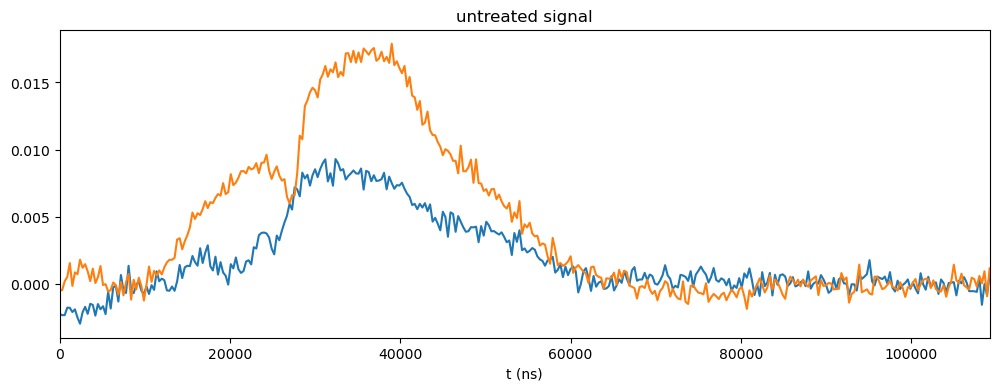

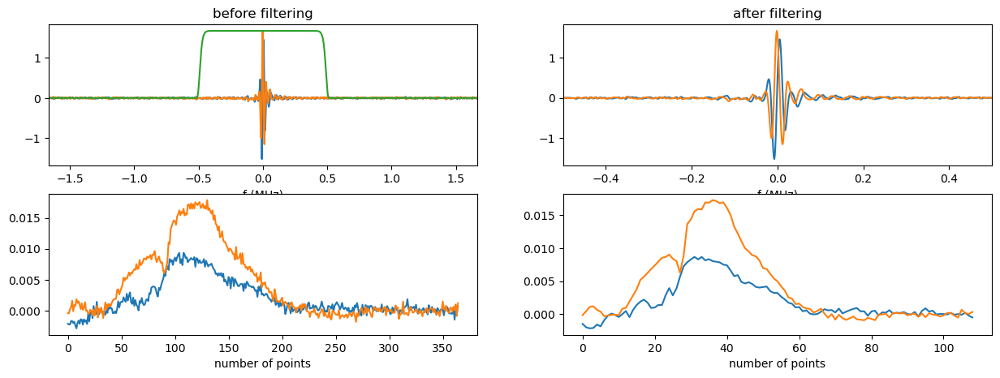

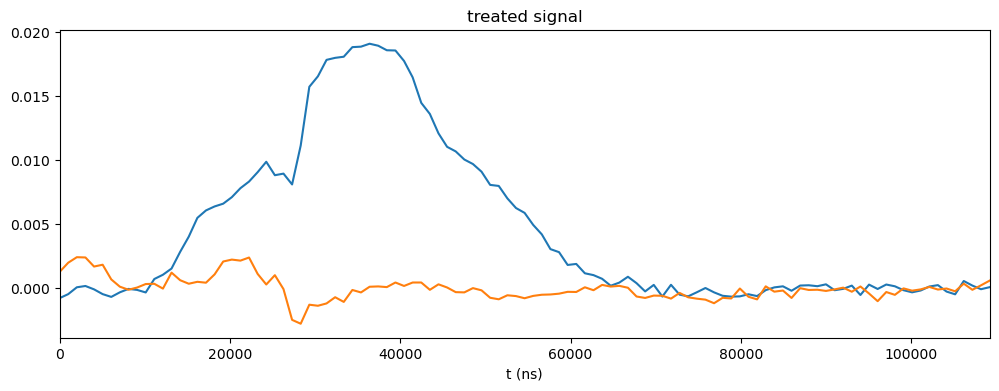

In [24]:
result_on_res = echo_data_treatment(data_int, 35, 400, tres=300e-9,
                                      baseline=True, baseline_start=-100, baseline_stop=-1,
                                      freq_shift=None,
                                      filt=True, filt_opt={'bandwidth':1e6, 'centre':0e6},
                                      ph_corr=True,
                                      plot=True,
                                      plot_dem_filt=True)

## Sweeping with tau

In [25]:
data_list = []
data_int_list = []
tau_list = []


res_freq_list = []
Q_list = []

attenuation = 20
amp = 1
len_pi_over_2 = int(12e3)
len_pi = 2*len_pi_over_2
# tau = int(20e3)
rec_del = int(10e9)
avg_nb = 5
dummy_nb = 5
steps=None
ctp=None
acq_tres = 300
# integ_len = 16000

B0_mT = 106.8
recorded_field = measure.set_magnetic_field(
    magnet, B0_mT, magnet_type="AM1430", sleep_time=None, options=magnet_options
)
print(f"Fixed field: {recorded_field} mT")


Starting at field 106.80mT
Setting field to 106.80mT
Fixed field: 106.80424189595655 mT


In [26]:
tau_vals = np.logspace(np.log10(30e3), np.log10(20000e3), 24).astype(int)

tau = 30000 ns (30.00 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


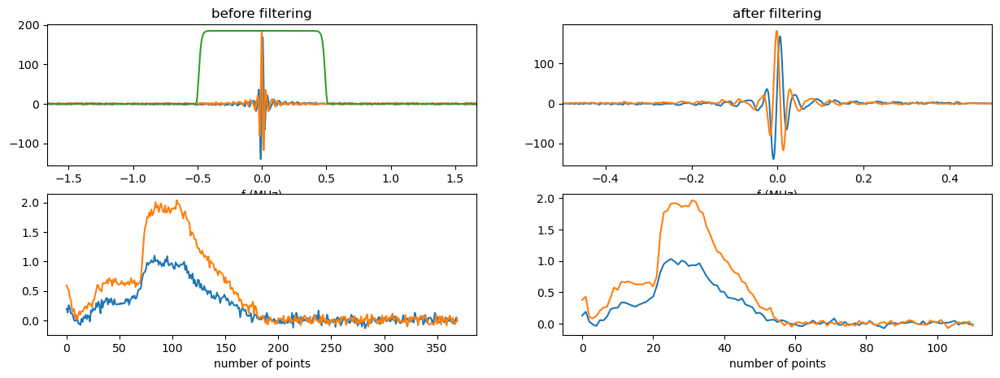

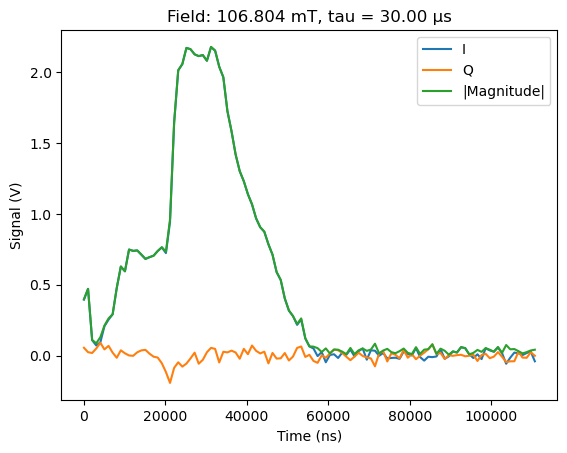

tau = 39801 ns (39.80 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


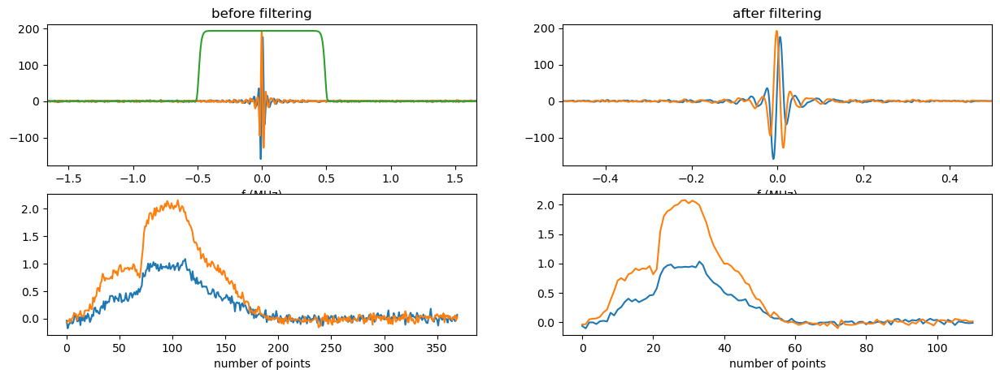

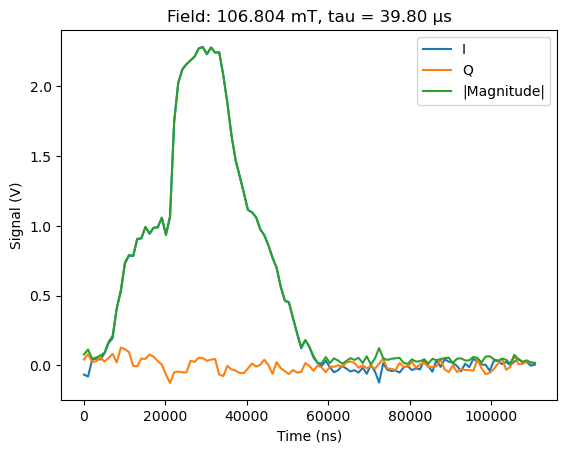

tau = 52805 ns (52.80 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


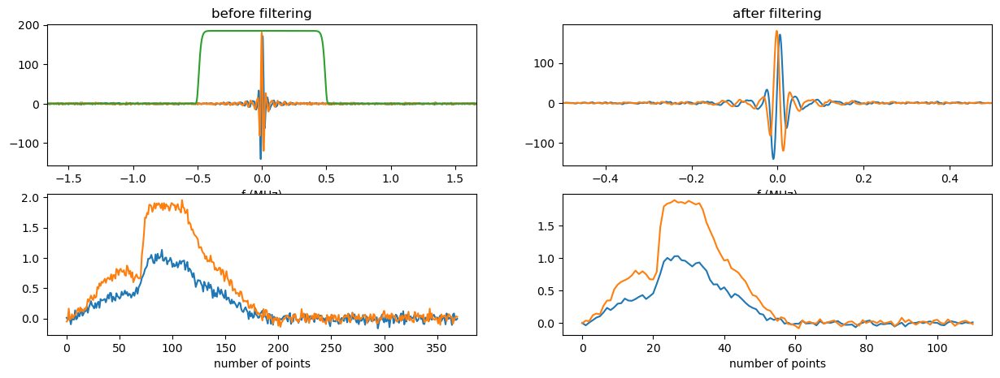

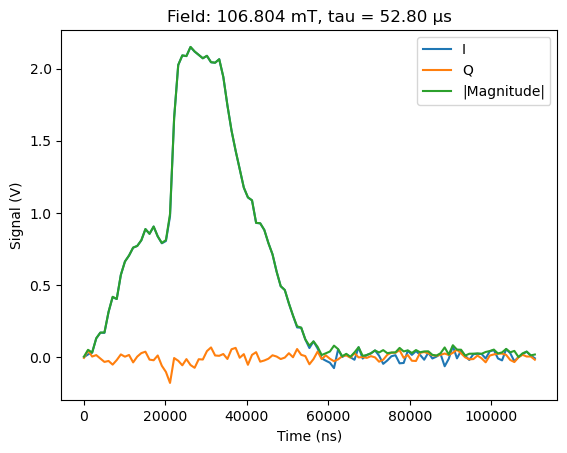

tau = 70057 ns (70.06 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


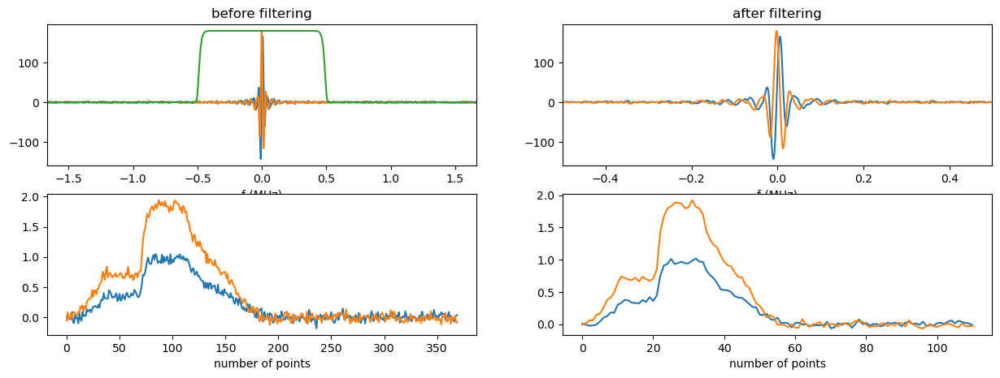

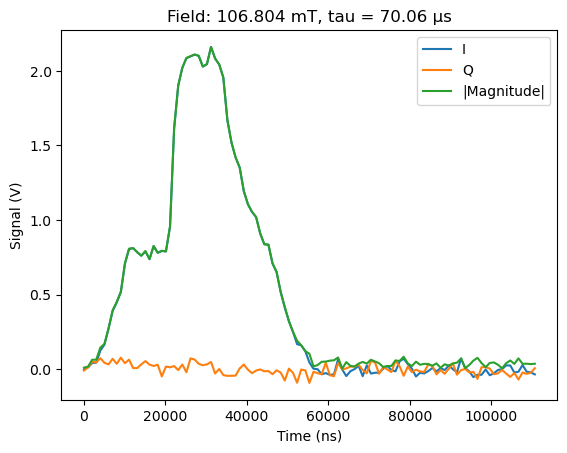

tau = 92947 ns (92.95 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


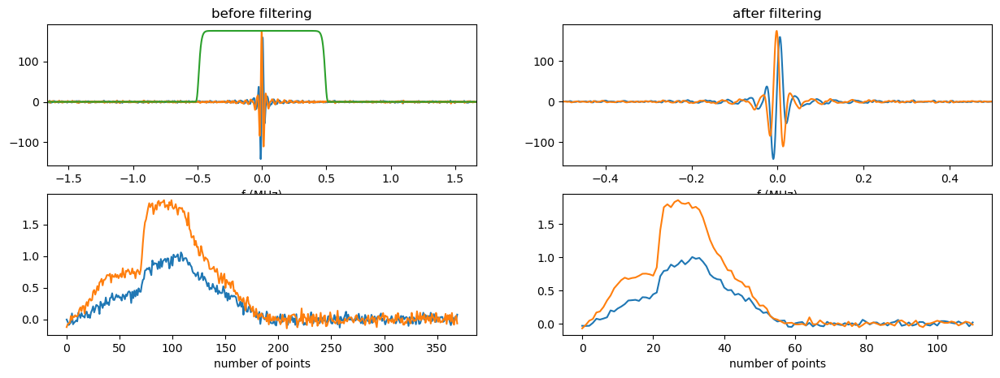

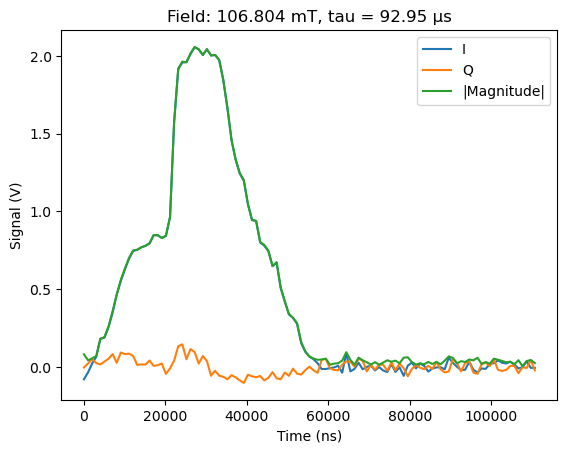

tau = 123314 ns (123.31 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


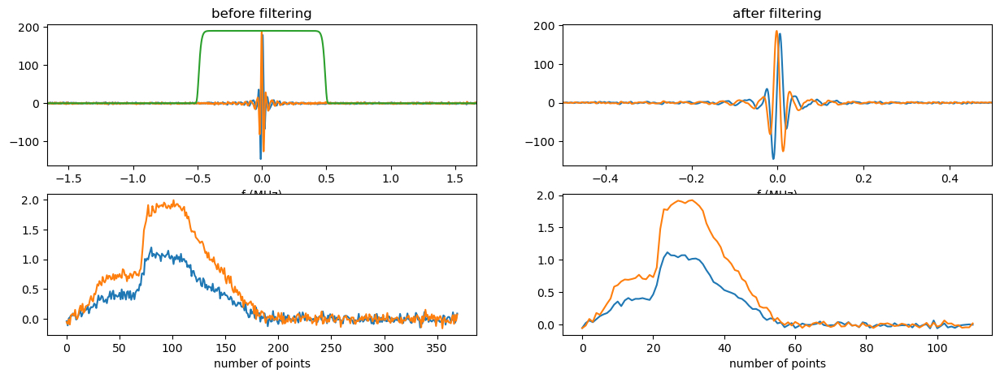

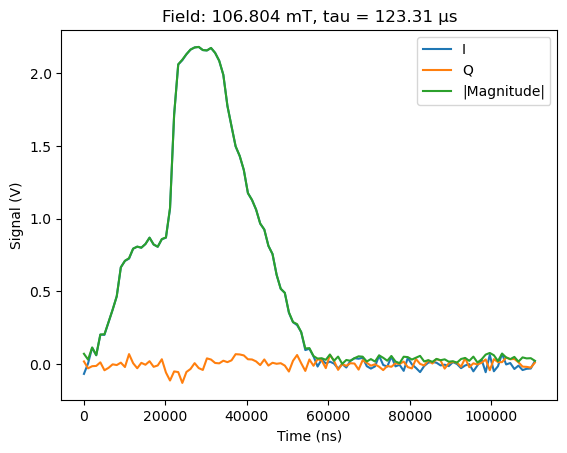

tau = 163603 ns (163.60 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


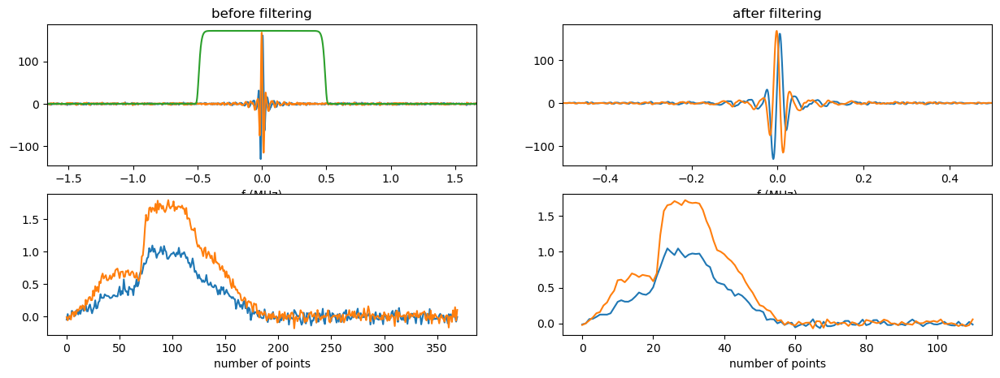

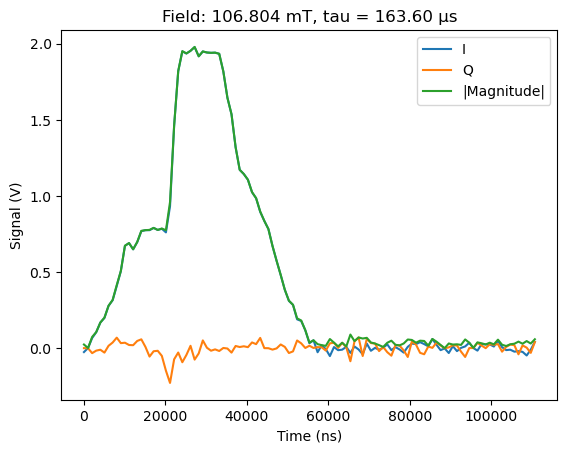

tau = 217055 ns (217.06 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


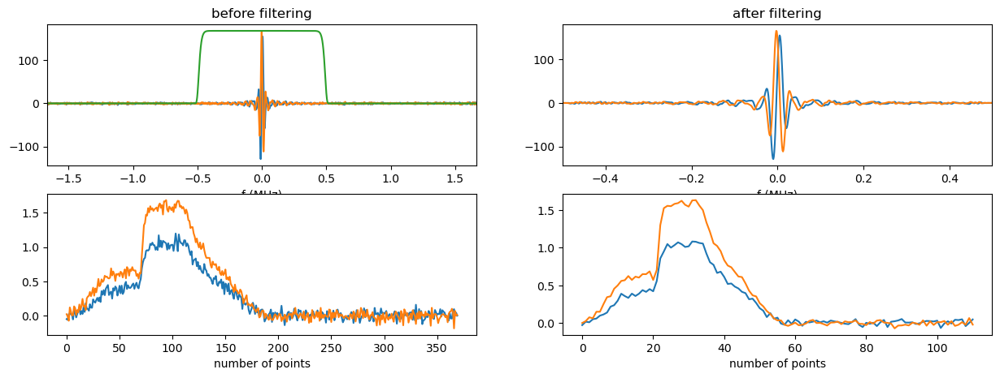

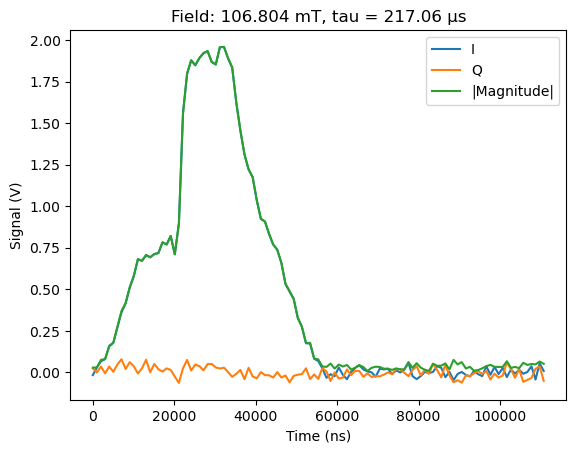

tau = 287972 ns (287.97 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


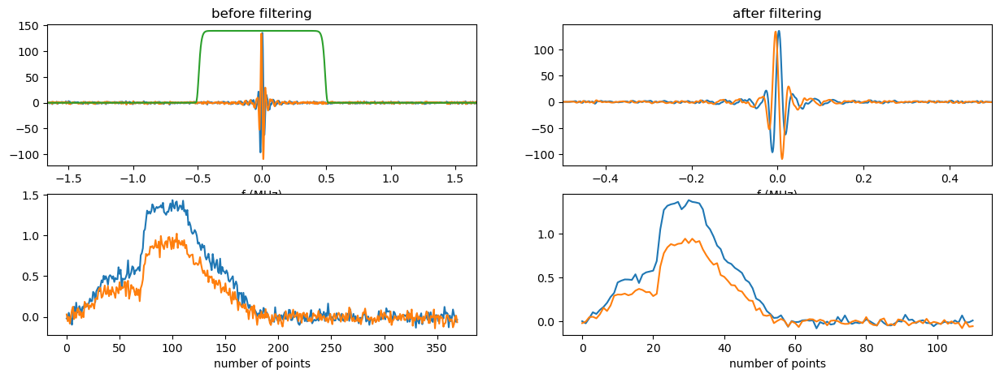

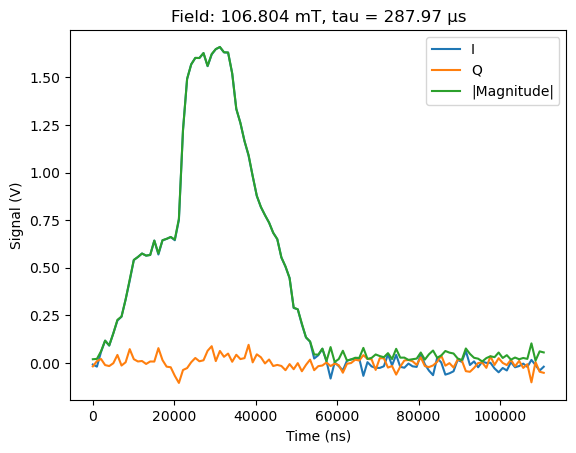

tau = 382057 ns (382.06 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


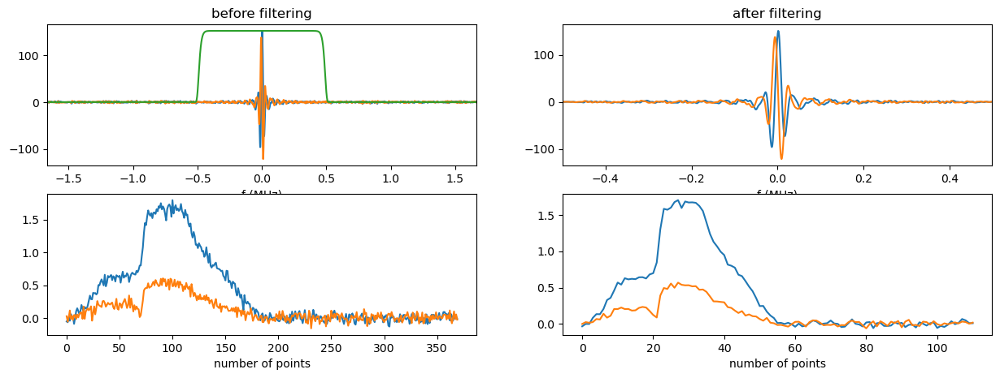

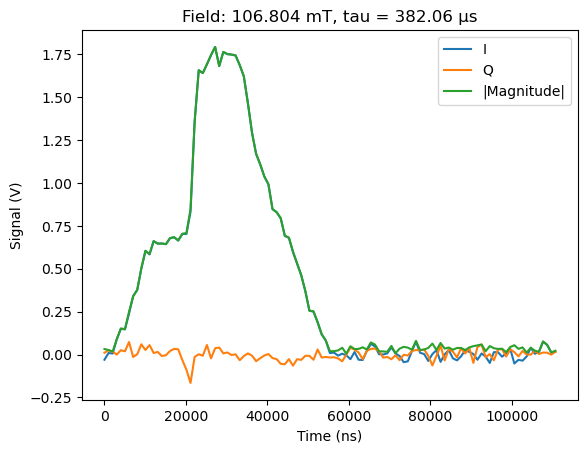

tau = 506882 ns (506.88 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


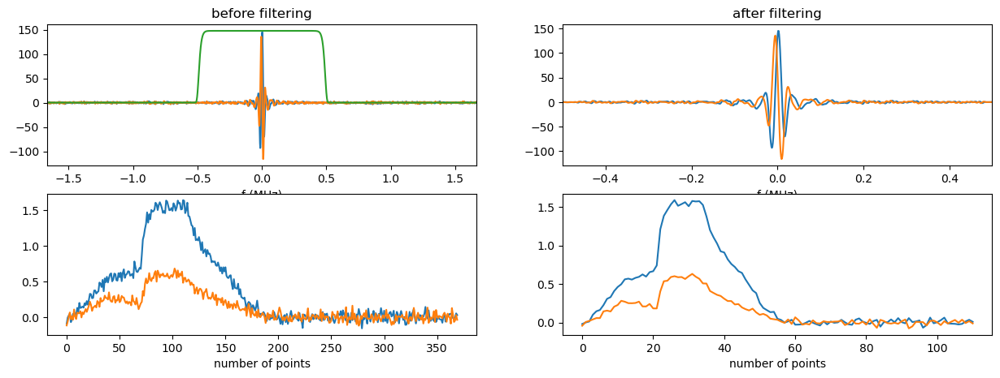

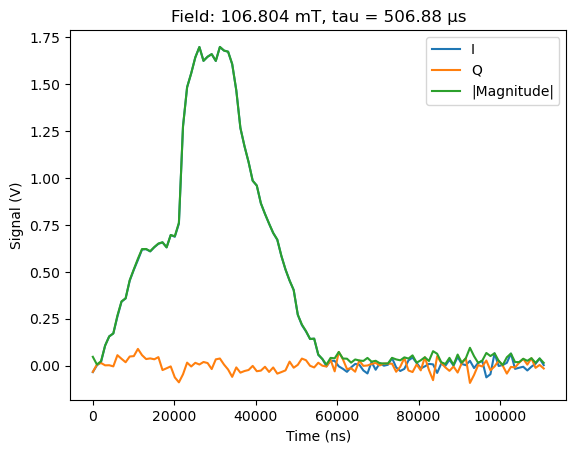

tau = 672490 ns (672.49 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


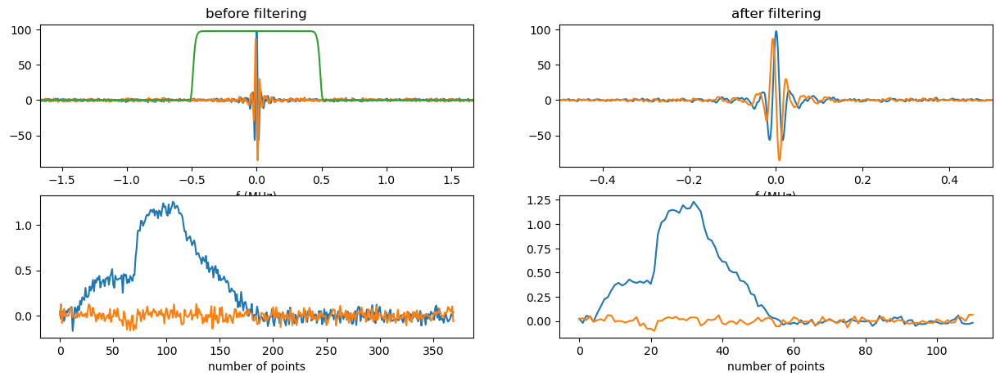

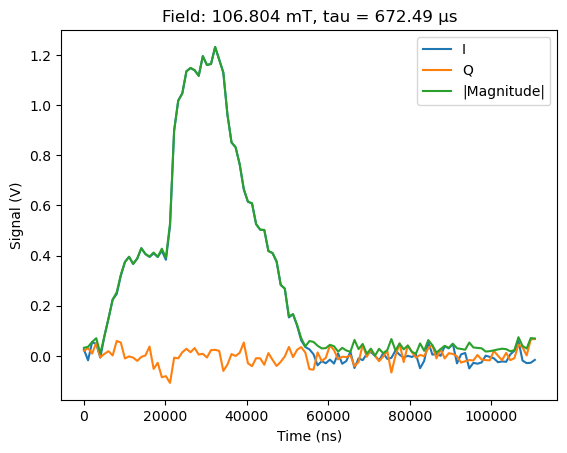

tau = 892205 ns (892.21 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


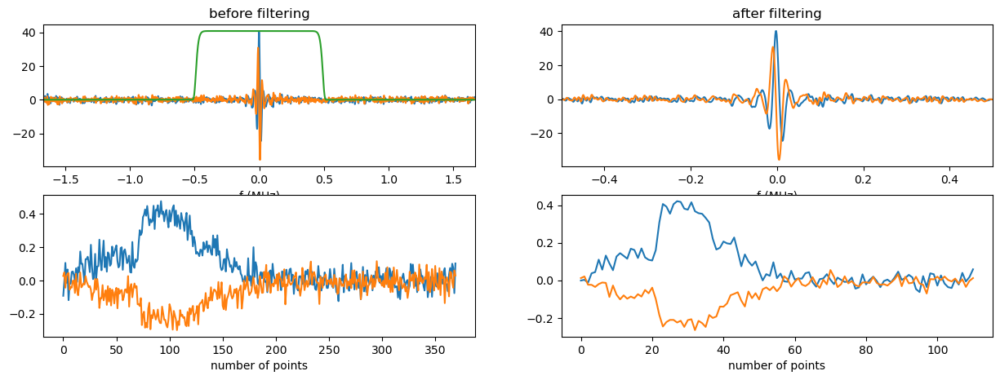

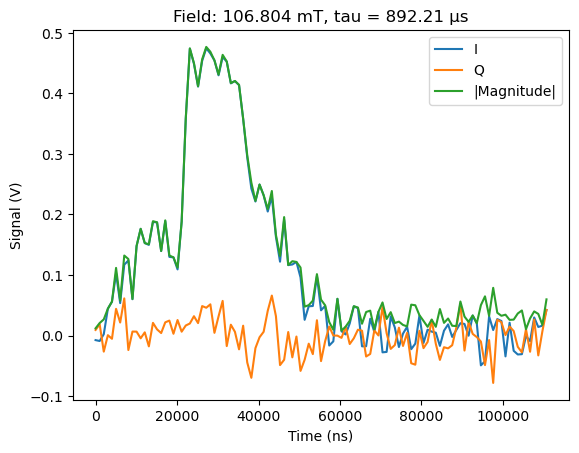

tau = 1183705 ns (1183.70 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


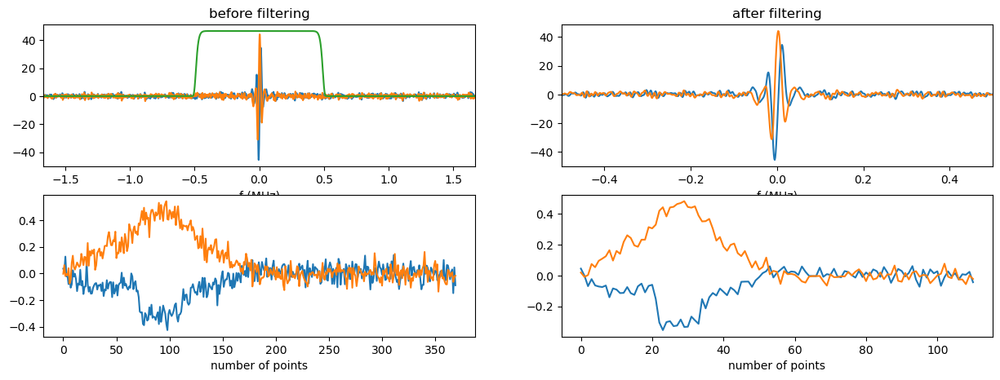

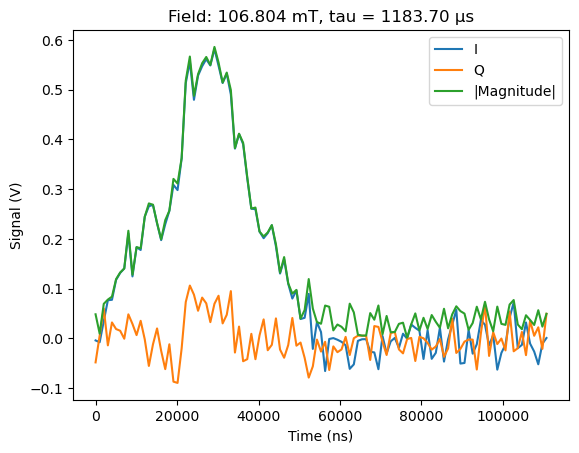

tau = 1570443 ns (1570.44 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


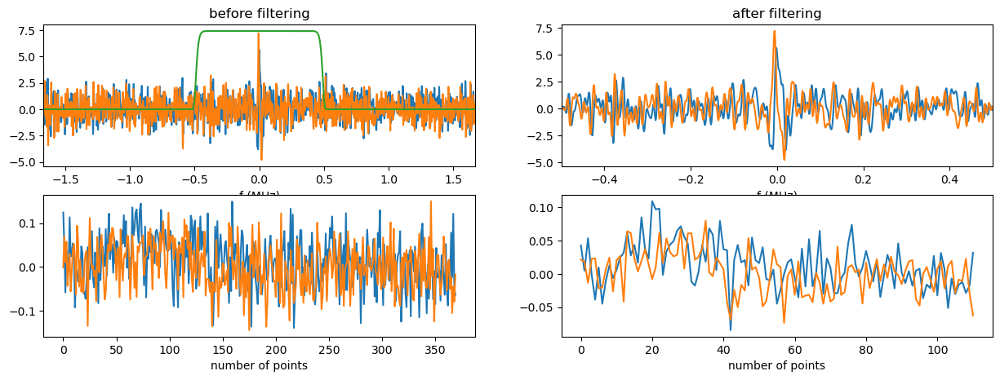

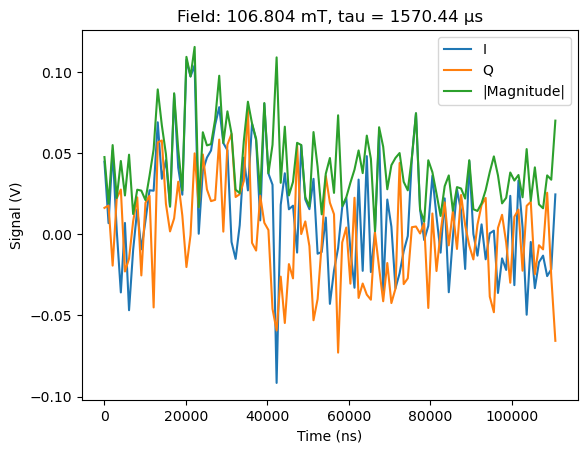

tau = 2083535 ns (2083.53 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


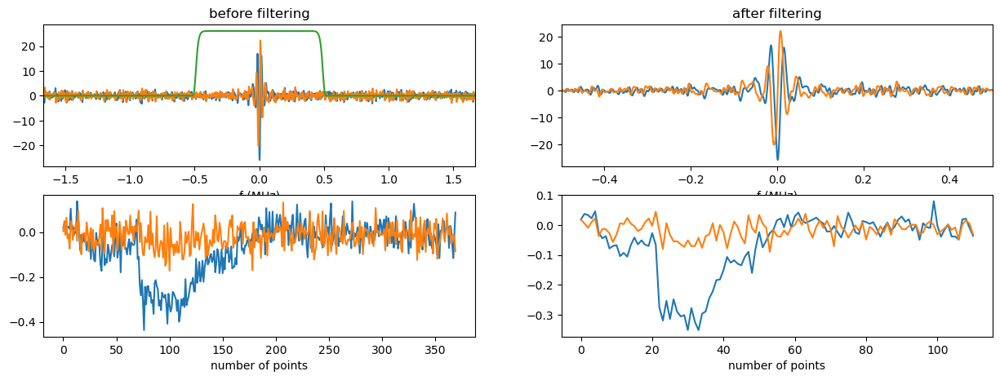

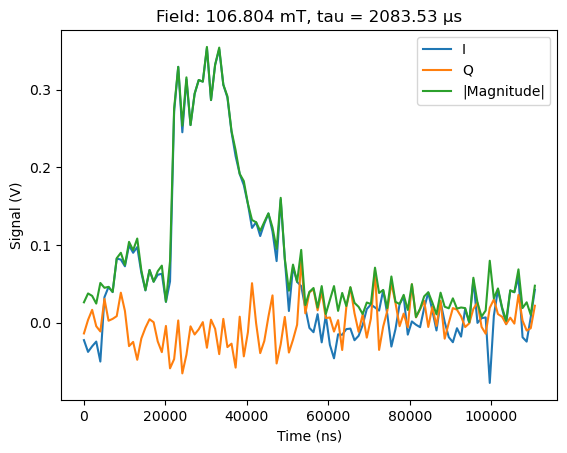

tau = 2764263 ns (2764.26 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


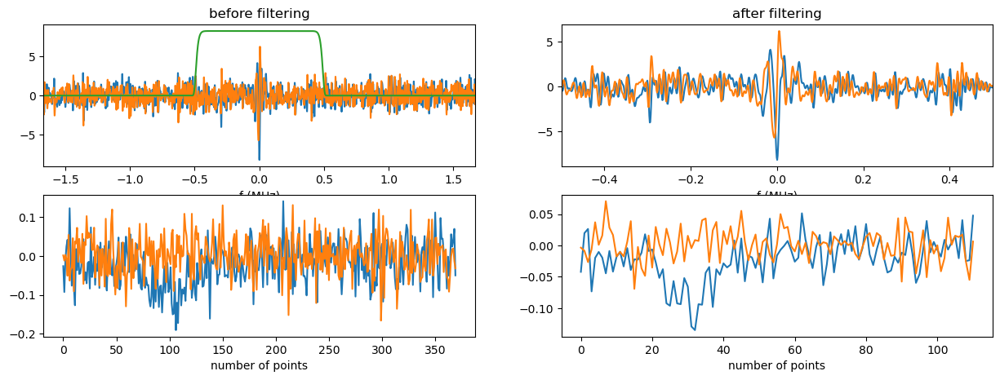

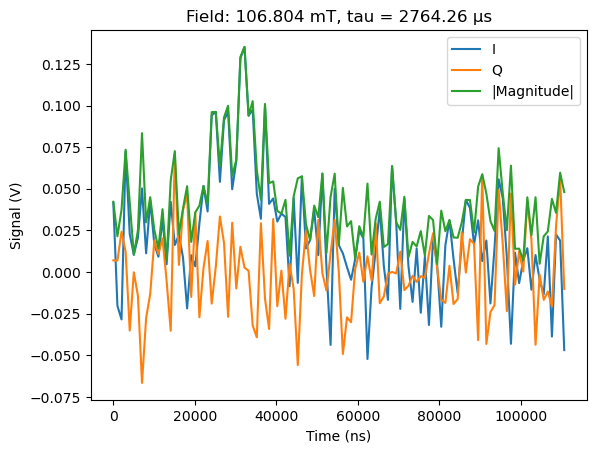

tau = 3667398 ns (3667.40 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


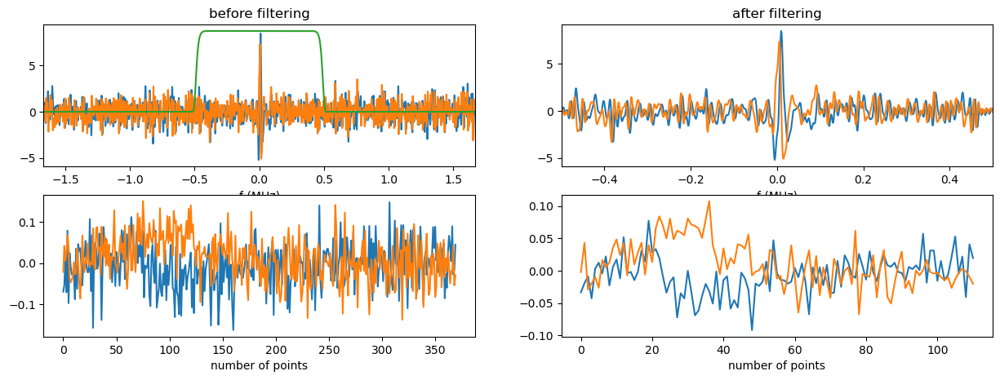

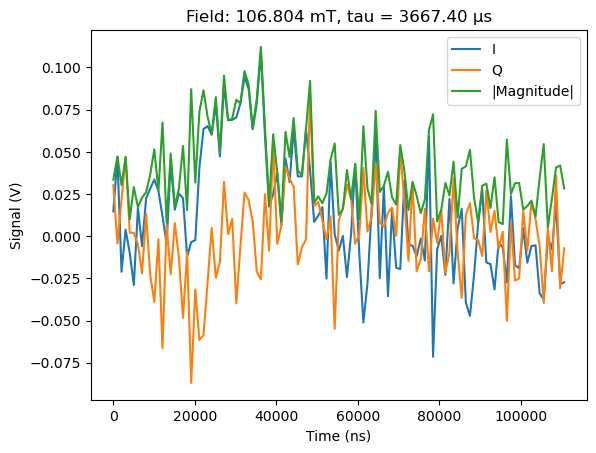

tau = 4865604 ns (4865.60 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


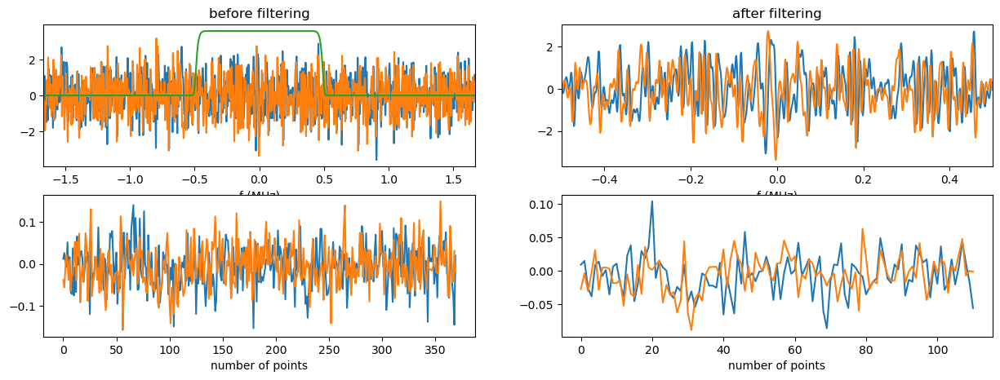

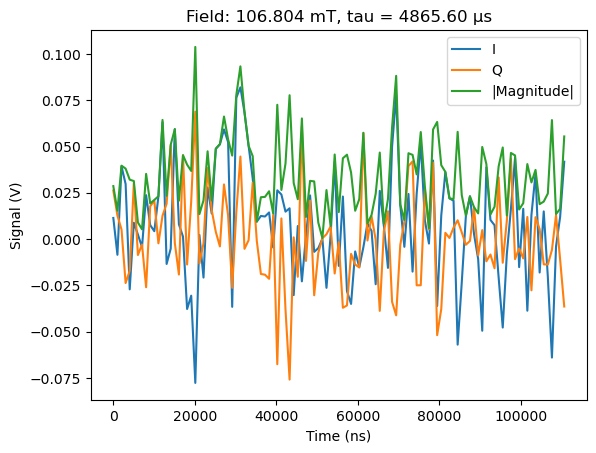

tau = 6455285 ns (6455.28 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


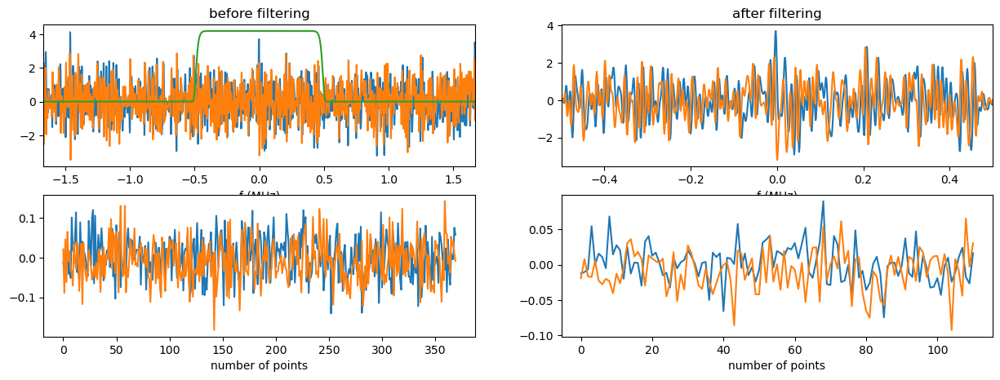

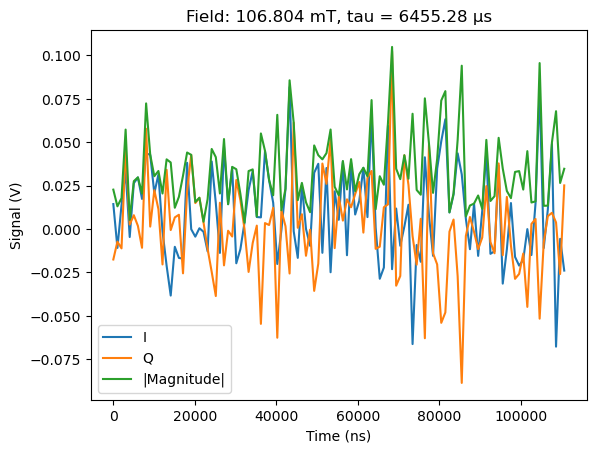

tau = 8564343 ns (8564.34 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


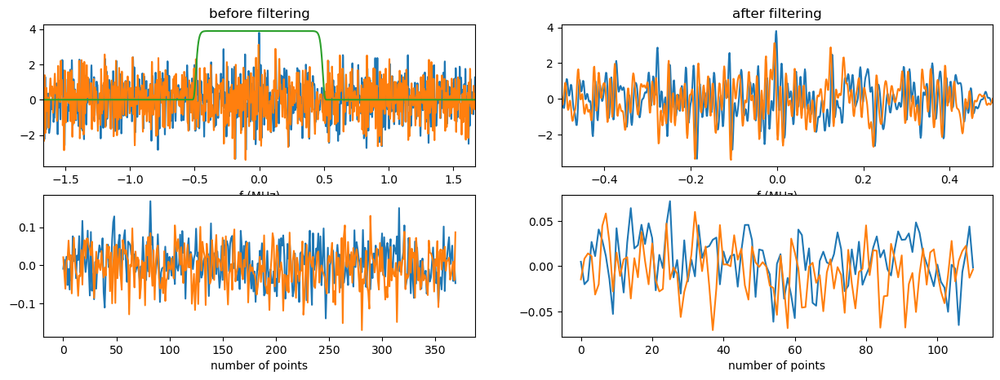

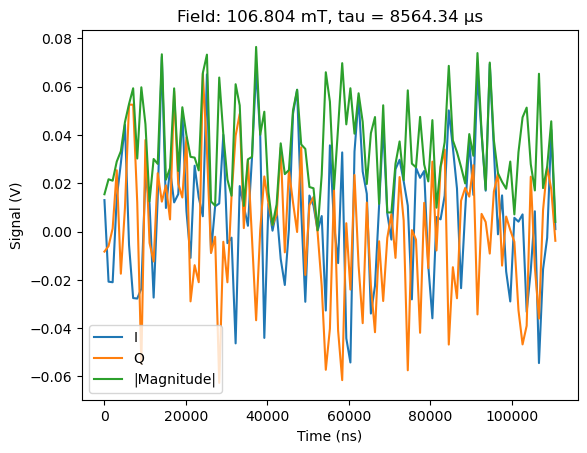

tau = 11362469 ns (11362.47 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


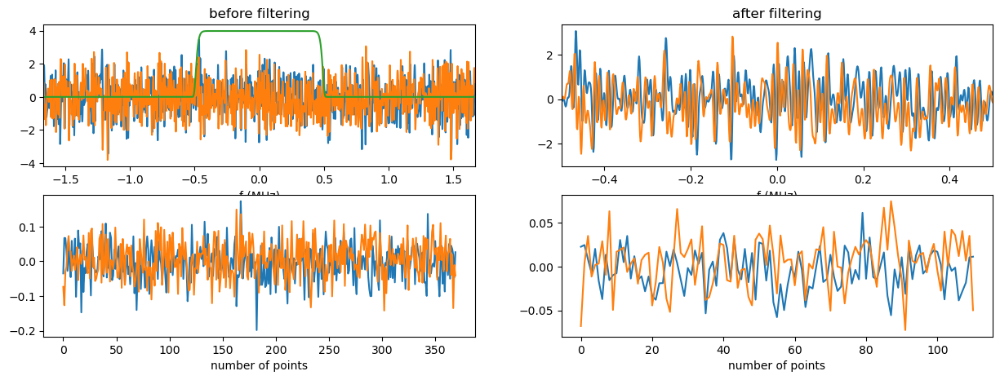

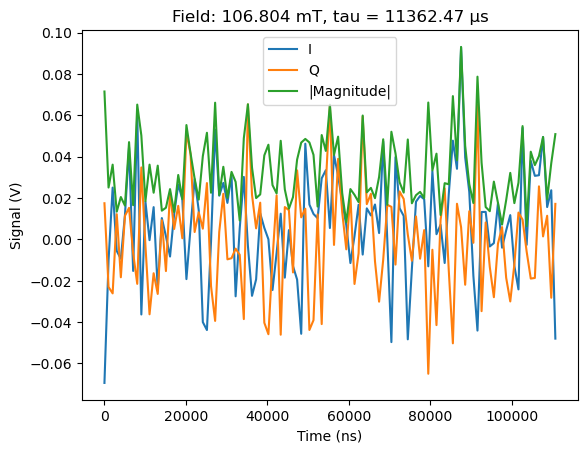

tau = 15074792 ns (15074.79 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


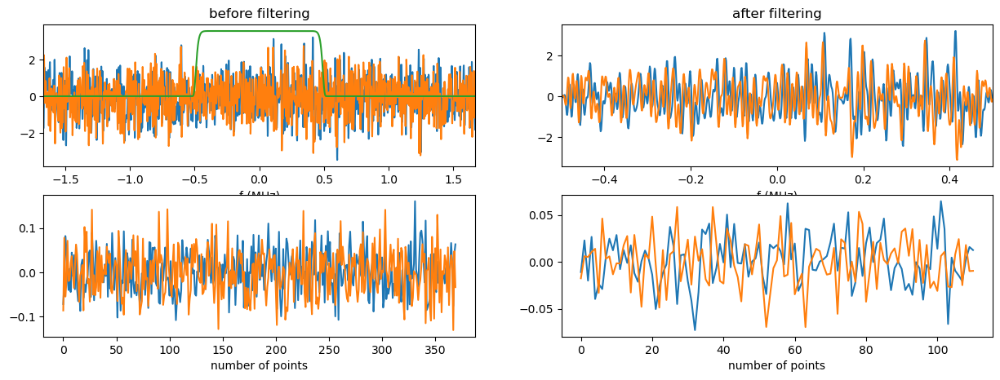

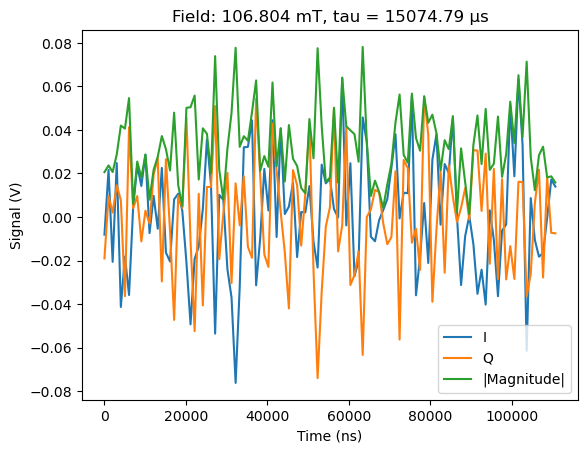

tau = 20000000 ns (20000.00 µs)
Acquisition status:
Status: OKAY, State: RUNNING, Info Flags: NONE, Warning Flags: NONE, Error Flags: NONE, Log: []
Acquisition status:
Status: OKAY, State: STOPPED, Info Flags: FORCED_STOP, ACQ_SCOPE_DONE_PATH_0, ACQ_SCOPE_OVERWRITTEN_PATH_0, ACQ_SCOPE_DONE_PATH_1, ACQ_SCOPE_OVERWRITTEN_PATH_1, ACQ_BINNING_DONE, Warning Flags: NONE, Error Flags: NONE, Log: []


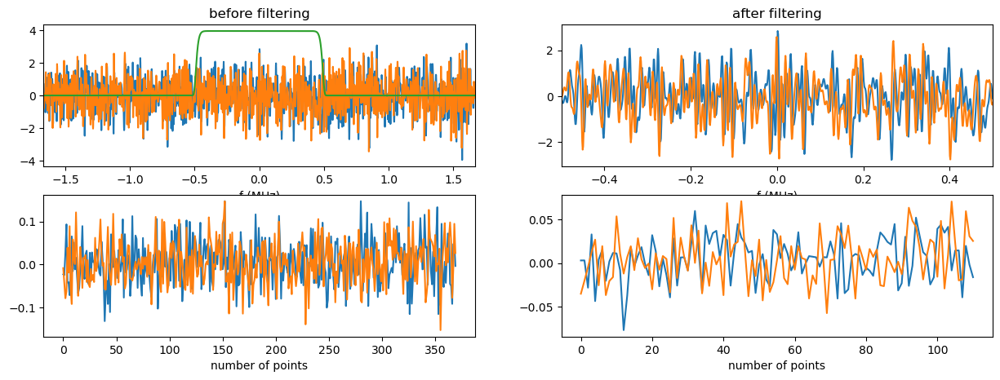

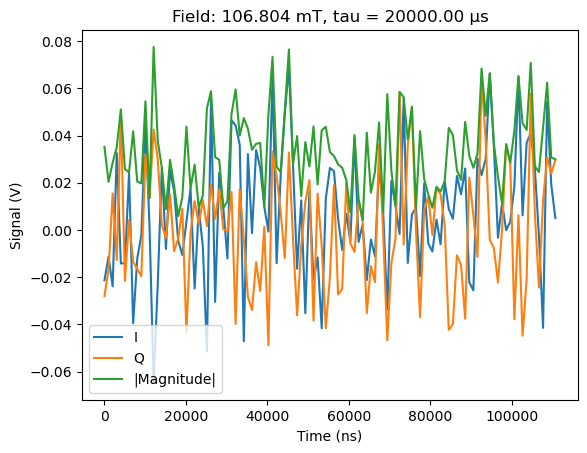

In [28]:
#pre-saturation

n = 5
for i in range(n):
    sequence = hahnecho(amp, len_pi_over_2, len_pi, tau, rec_del, avg_nb=32, acq_pos=-38000, steps=None, ctp=None, dummy_nb=dummy_nb, acq_tres=acq_tres, acq_npts=1000)
    
    qblox_esr.qrm_rf_awg( 
        qrm_rf, lo_freq=freq_pulse - nco_f, nco_freq=nco_f,
        in0_att=0, out0_att=attenuation
    )
    qrm_rf.sequencer0.nco_prop_delay_comp_en(True)
    
    qblox_esr.config_acq(qrm_rf, integ_len=acq_tres)
    qrm_rf.sequencer0.sequence(sequence)
    qrm_rf.arm_sequencer(0)
    qrm_rf.start_sequencer()
    
    # time.sleep(rec_del/1e9)

for tau in tau_vals:
    print(f"tau = {tau} ns ({tau*1e-3:.2f} µs)")

    sequence = hahnecho(amp, len_pi_over_2, len_pi, tau, rec_del, avg_nb=avg_nb, acq_pos=-30000, steps=None, ctp=None, dummy_nb=dummy_nb, acq_tres=acq_tres, acq_npts=1000)
    # res_freq, Q = find_resonance_and_quality_factor(fr_guess=3185.747e6, f_start=-4e6, f_stop=4e6, f_npts=25, attenuation=10, ringdown_length=120e-9, pulse_amplitude=0.51, pulse_length=500, rec_del=int(20e3), avg_nb=int(10e2), plot_all=False, plot=True)
    # print(f'Resonance frequency = {round(res_freq/1e6, 3)}MHz, Q = {Q}')
    # res_freq_list.append(res_freq)
    # Q_list.append(Q)

    qblox_esr.qrm_rf_awg( 
        qrm_rf, lo_freq=freq_pulse - nco_f, nco_freq=nco_f,
        in0_att=0, out0_att=attenuation
    )
    qrm_rf.sequencer0.nco_prop_delay_comp_en(True)

    qblox_esr.config_acq(qrm_rf, integ_len=acq_tres)
    qrm_rf.sequencer0.sequence(sequence)
    qrm_rf.arm_sequencer(0)
    qrm_rf.start_sequencer()

    time.sleep(rec_del/1e9)

    data = get_data()
    data_int = get_data_int()

    data_list.append(data)
    data_int_list.append(data_int)
    tau_list.append(tau)

    result_on_res = echo_data_treatment(data_int, 30, 400, tres=300e-9,
                                baseline=True, baseline_start=-100, baseline_stop=-1,
                                freq_shift=None,
                                filt=True, filt_opt={'bandwidth':1e6, 'centre':0e6},
                                ph_corr=True,
                                plot=False,
                                plot_dem_filt=True
                            )

    t_ns, sig = result_on_res
    plt.figure()
    plt.plot(t_ns, np.real(sig), label='I')
    plt.plot(t_ns, np.imag(sig), label='Q')
    plt.plot(t_ns, np.abs(sig), label='|Magnitude|')
    plt.xlabel('Time (ns)')
    plt.ylabel('Signal (V)')
    plt.title(f'Field: {recorded_field:.3f} mT, tau = {tau*1e-3:.2f} µs')
    plt.legend()
    plt.show()


In [29]:
# in T!
ix.field(0)
iy.field(0)
iz.field(0)

In [47]:

def integrate_echo_core_real_sum(t_ns, sig, search_window=(20000, 50000), fwhm_scale=1.2):
    """
    - Find echo peak in |sig| within search_window (ns)
    - Estimate FWHM from |sig|
    - Sum REAL(sig) within fwhm_scale * FWHM window around the peak
    Returns:
        amp_scalar, (w0, w1)
    """
    t0, t1 = search_window
    m = (t_ns >= t0) & (t_ns <= t1)
    if not np.any(m):
        raise ValueError("search_window does not overlap t_ns range")

    t = t_ns[m]
    s = sig[m]
    env = np.abs(s)

    i0 = int(np.argmax(env))
    half = 0.5 * env[i0]

    # FWHM edges
    il = i0
    while il > 0 and env[il] > half:
        il -= 1

    ir = i0
    while ir < len(env) - 1 and env[ir] > half:
        ir += 1

    # FWHM 
    fwhm = (t[ir] - t[il]) if (ir != il) else (t[1] - t[0]) * 5

    t_center = t[i0]
    halfwin = 0.5 * fwhm_scale * fwhm
    w0, w1 = t_center - halfwin, t_center + halfwin

    w = (t_ns >= w0) & (t_ns <= w1)

    
    amp_scalar = np.sum(np.real(sig[w]))
    return amp_scalar, (w0, w1)


def T2_model(t_us, A, T2, C):
   
    return A * np.exp(-t_us / T2) + C


attenuation = 20
amp = 1
len_pi_over_2 = int(10e3)
len_pi = 2 * len_pi_over_2
rec_del = int(10e9)
avg_nb = 10
dummy_nb = 3
acq_tres = 300

# IMPORTANT: choose a search window that contains your echo peak
# The screenshot suggests ~20k–45k ns, adjust if needed.
ECHO_SEARCH_WINDOW_NS = (20000, 45000)

# Optional: skip first N points in fit (as you were doing [5:])
FIT_SKIP = 5


data_list = []
data_int_list = []
tau_list = []
amp_list = []


tau_pre = int(tau_vals[0]) if len(tau_vals) > 0 else int(40e3)
sequence = hahnecho(
    amp, len_pi_over_2, len_pi, tau_pre, rec_del,
    avg_nb=32, acq_pos=-38000, steps=None, ctp=None,
    dummy_nb=dummy_nb, acq_tres=acq_tres, acq_npts=1000
)


for tau in tau_vals:
    print(f"tau = {tau} ns ({tau*1e-3:.2f} µs)")

    sequence = hahnecho(
        amp, len_pi_over_2, len_pi, tau, rec_del,
        avg_nb=avg_nb, acq_pos=-38000, steps=None, ctp=None,
        dummy_nb=dummy_nb, acq_tres=acq_tres, acq_npts=1000
    )

    time.sleep(rec_del / 1e9)

    qblox_esr.qrm_rf_awg(
        qrm_rf,
        lo_freq=freq_pulse - nco_f,
        nco_freq=nco_f,
        in0_att=0,
        out0_att=attenuation
    )
    qrm_rf.sequencer0.nco_prop_delay_comp_en(True)

    qblox_esr.config_acq(qrm_rf, integ_len=acq_tres)
    qrm_rf.sequencer0.sequence(sequence)
    qrm_rf.arm_sequencer(0)
    qrm_rf.start_sequencer()

    data = get_data()
    data_int = get_data_int()

    data_list.append(data)
    data_int_list.append(data_int)
    tau_list.append(tau)

    
    t_ns, sig = echo_data_treatment(
        data_int, 20, 300, tres=300e-9,
        baseline=True, baseline_start=-100, baseline_stop=-1,
        freq_shift=None,
        filt=True, filt_opt={'bandwidth': 1e6, 'centre': 0e6},
        ph_corr=True,
        plot=False,
        plot_dem_filt=False
    )

    # --- MEASUREMENT: sum REAL part over ~1.2*FWHM around echo peak ---
    amp_scalar, (w0, w1) = integrate_echo_core_real_sum(
        t_ns, sig,
        search_window=ECHO_SEARCH_WINDOW_NS,
        fwhm_scale=1.2
    )
    amp_list.append(amp_scalar)
    plt.figure()
    plt.plot(t_ns, np.real(sig), label='I')
    plt.plot(t_ns, np.imag(sig), label='Q')
    plt.plot(t_ns, np.abs(sig), label='|Magnitude|')
    plt.axvspan(w0, w1, alpha=0.2, label='1.2×FWHM window')
    plt.xlabel('Time (ns)')
    plt.ylabel('Signal (a.u.)')
    plt.title(f'Field: {recorded_field:.3f} mT, tau = {tau*1e-3:.2f} µs, A={amp_scalar:.2f}')
    plt.legend()
    plt.show()




NameError: name 'dedent' is not defined

In [31]:
filename = "C:/Users/Administrator/Documents/Gargi/Tau_sweep/1701026_106.5mT_xaxis_integrated_reflection.h5"
comments = 'EDFS_echo_test'
data2save = {
    'raw signal intensity (2D) (a.u.)': data_list,
    'integrated signal intensity (a.u.)': data_int_list,
    'tau (ns)': tau_list,   
    'resonator frequency (Hz)': res_freq_list,         
}

metadata = {
    'pulse amplitude': amp,
    'recycling delay (ns)': rec_del,
    'length of pi pulse (ns)': len_pi,
    'length of pi over 2 pulse (ns)': len_pi_over_2,
    'NCO frequency (Hz)': nco_f,
    'number of averages': avg_nb,
    'number of dummy points': dummy_nb,
    'attenuation on qblox output (dB)': attenuation,
    'tau sweep values (ns)': tau_vals, 
}

process.save_h5(filename, data2save, metadata, comments=comments)

Data saved successfully to C:/Users/Administrator/Documents/Gargi/Tau_sweep/1701026_106.5mT_xaxis_integrated_reflection.h5


### Measurement in reflection 3.14GHz resonator 0->3 transition

In [11]:
data, metadata, comments = process.open_h5('C:/Users/Administrator/Documents/Gargi/Tau_sweep/1501026_40mT_xaxis_integrated_reflection.h5')
data_int_list = data['integrated signal intensity (a.u.)']
tau_list = data['tau (ns)']
res_freq_list = data['resonator frequency (Hz)']

In [56]:
# for data_int_i in range(len(data_int_list):
# data_int_list[data_int_i]

### open data

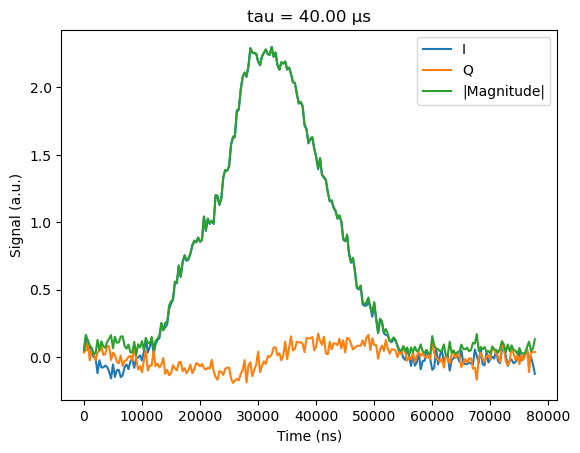

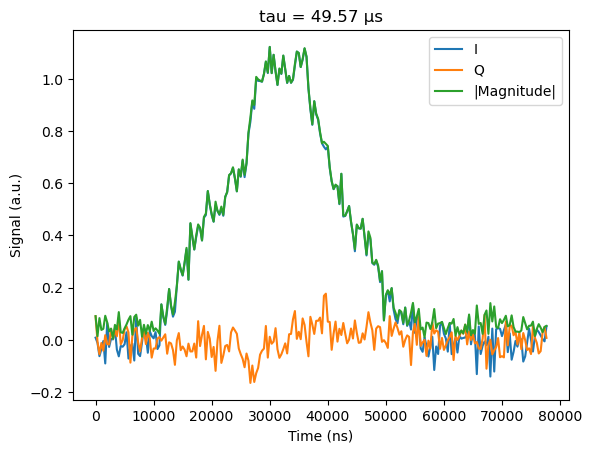

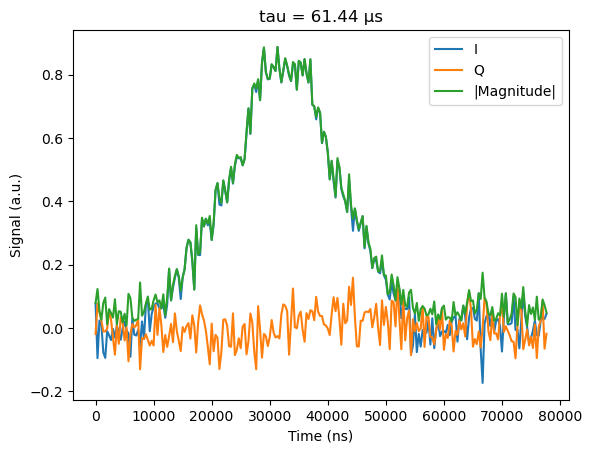

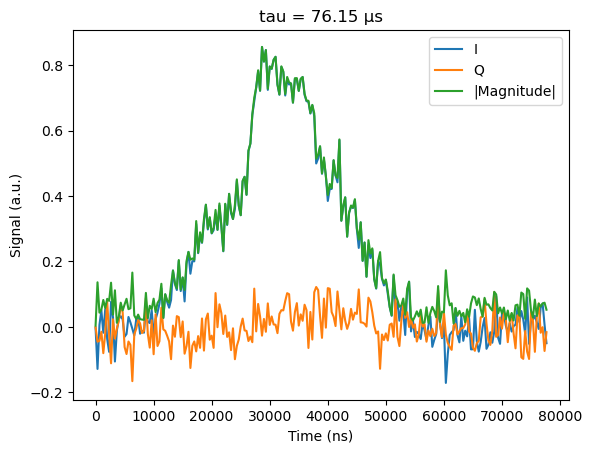

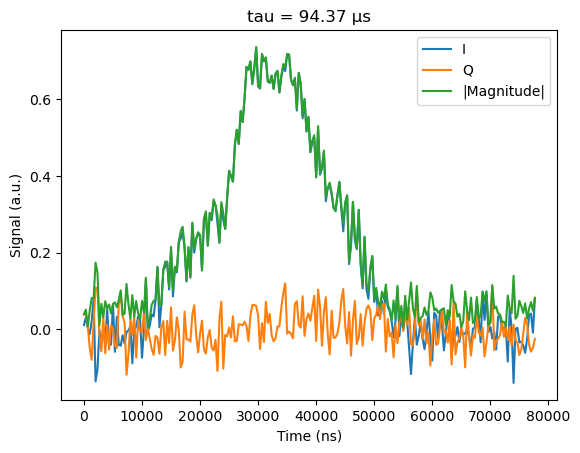

...

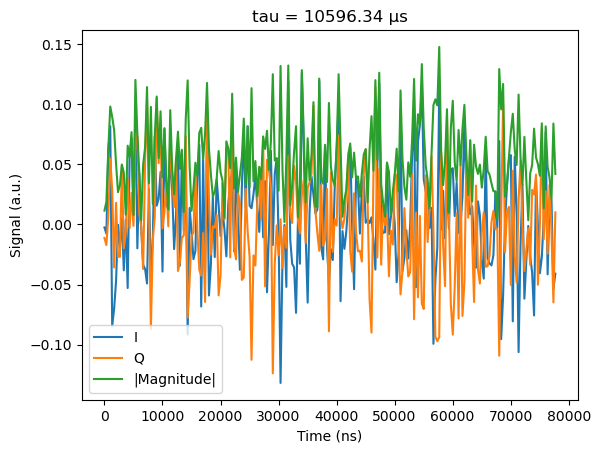

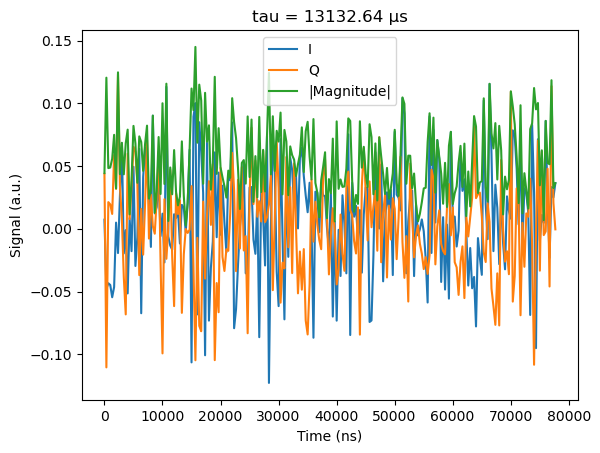

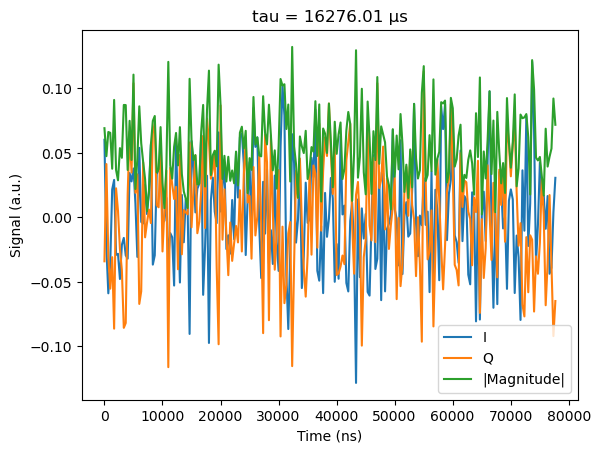

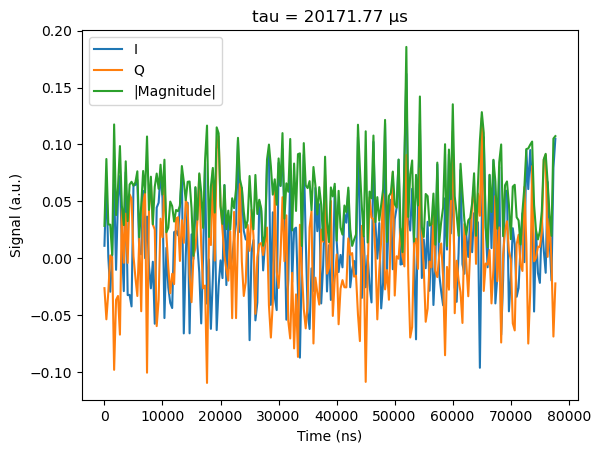

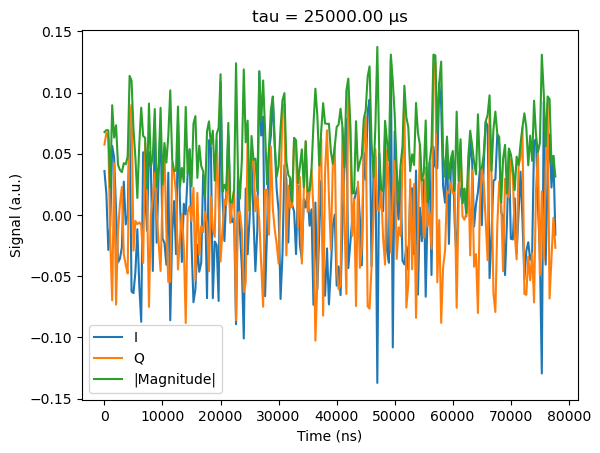

In [17]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

for tau, data_int in zip(tau_list, data_int_list):
    
    '''
    t_ns = np.arange(len(data_int)) * acq_tres  
    I = np.real(data)
    Q = np.imag(data)
    Mag = np.abs(data)
    '''
    '''

    plt.figure(figsize=(7,4))
    plt.plot(t_ns, I, label='I')
    plt.plot(t_ns, Q, label='Q')
    plt.plot(t_ns, Mag, label='|Magnitude|')

    plt.xlabel('Time (ns)')
    plt.ylabel('Signal (a.u.)')
    plt.title(f'tau = {tau/1000:.2f} µs')
    plt.legend()

    plt.show() 
    '''

    t_ns, sig = echo_data_treatment(
    data_int, 40, 300, tres=300e-9,
    baseline=True, baseline_start=-100, baseline_stop=-1,
    freq_shift=None,
    filt=True, filt_opt={'bandwidth': 3e6, 'centre': 0e6},
    ph_corr=True,
    plot=False,
    plot_dem_filt=False)

    
    plt.figure()
    plt.plot(t_ns, np.real(sig), label='I')
    plt.plot(t_ns, np.imag(sig), label='Q')
    plt.plot(t_ns, np.abs(sig), label='|Magnitude|')
    # plt.axvspan(w0, w1, alpha=0.2, label='1.2×FWHM window')
    plt.xlabel('Time (ns)')
    plt.ylabel('Signal (a.u.)')
    plt.title(f'tau = {tau*1e-3:.2f} µs')
    plt.legend()
    plt.show()



## Integrating only 1.2*FWHM

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def estimate_center_fwhm(t_ns, y, smooth_pts=11):
    """
    Estimate center (peak time) and FWHM from y(t).
    y should be something like |sig| with baseline already handled.
    """
    t_ns = np.asarray(t_ns)
    y = np.asarray(y)

    if smooth_pts and smooth_pts > 1:
        k = int(smooth_pts)
        if k % 2 == 0:
            k += 1
        y = np.convolve(y, np.ones(k)/k, mode="same")

    i0 = int(np.argmax(y))
    ypk = float(y[i0])
    if not np.isfinite(ypk) or ypk <= 0:
        raise ValueError("Cannot estimate FWHM (peak <= 0 or non-finite).")

    half = 0.5 * ypk

    # search left and right
    left = i0
    while left > 0 and y[left] > half:
        left -= 1
    right = i0
    while right < len(y) - 1 and y[right] > half:
        right += 1

    if left == 0 or right == len(y) - 1:
        raise ValueError("Half-max crossing hit boundary; adjust acquisition window or preprocessing.")

    # linear interpolation crossings
    def interp_cross(i_low, i_high):
        x0, x1 = t_ns[i_low], t_ns[i_high]
        y0, y1 = y[i_low], y[i_high]
        return x0 + (half - y0) * (x1 - x0) / (y1 - y0)

    tL = interp_cross(left, left + 1)
    tR = interp_cross(right - 1, right)

    center_ns = float(t_ns[i0])
    fwhm_ns = float(tR - tL)
    return center_ns, fwhm_ns



w0 = w1 = None
window_defined = False

tau_us_list = []     
amp_int_list = []   

Fixed window from first trace: center=24343.78 ns, FWHM=21018.82 ns, window=[11732.49, 36955.07] ns


C:\Users\Administrator\AppData\Local\Temp\ipykernel_252\2261847874.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  amp_int = np.trapz(mag[mask], t_ns[mask])  # a.u. * ns


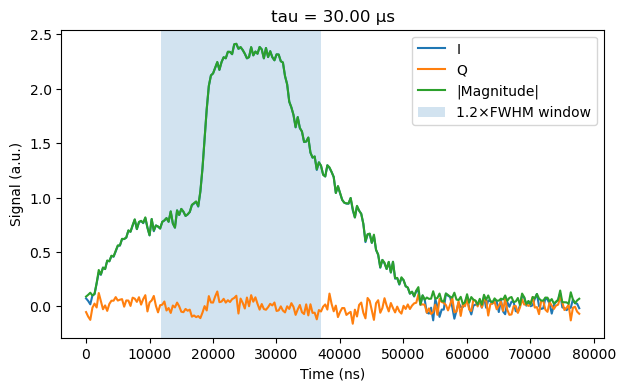

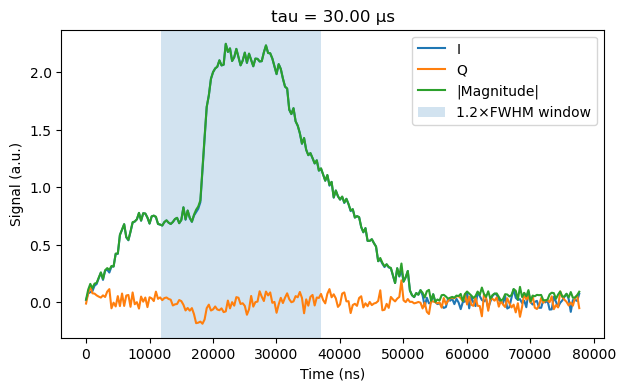

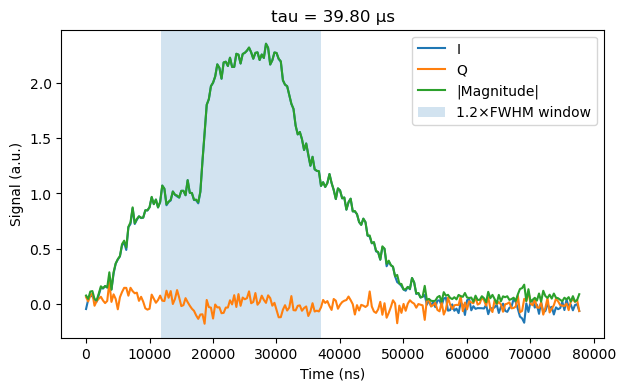

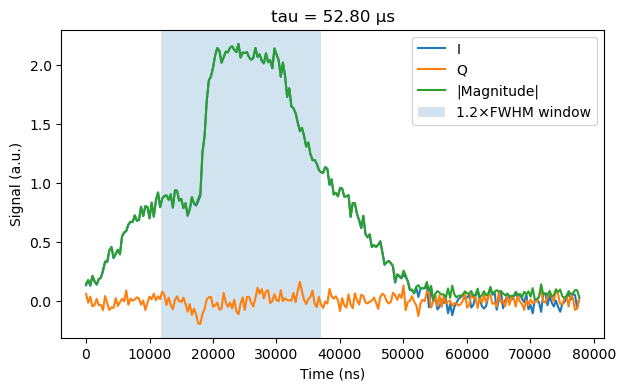

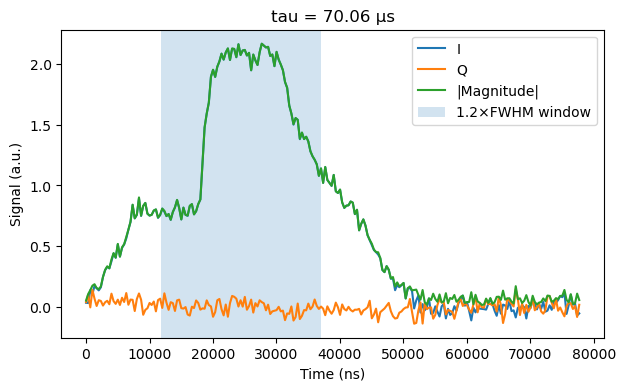

...

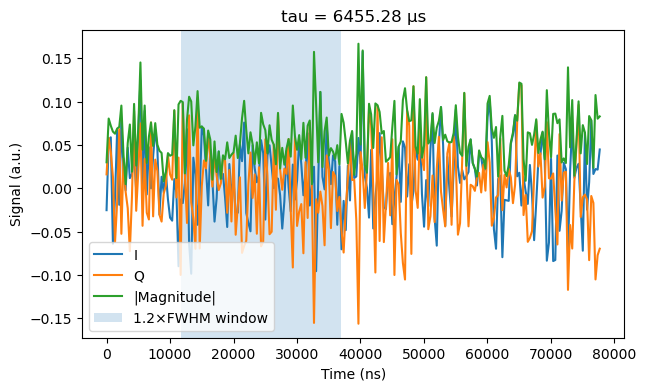

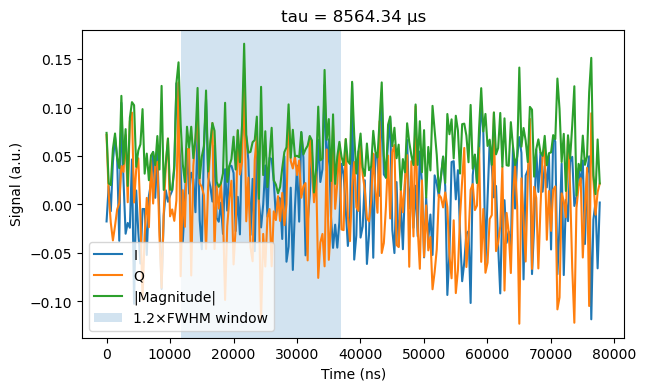

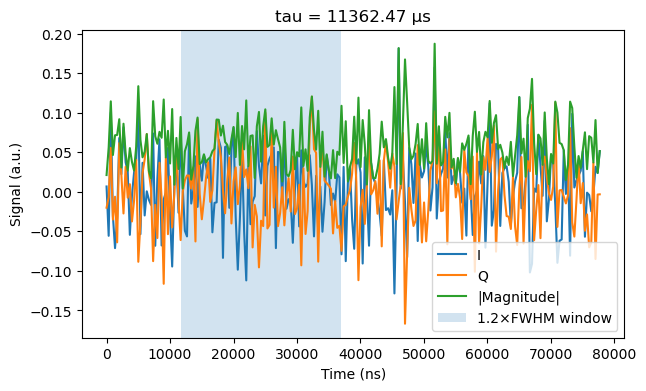

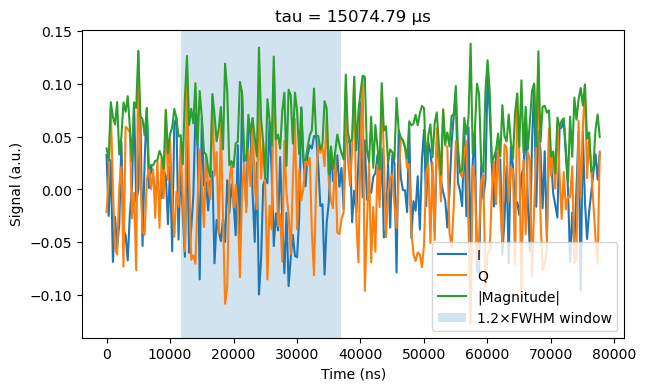

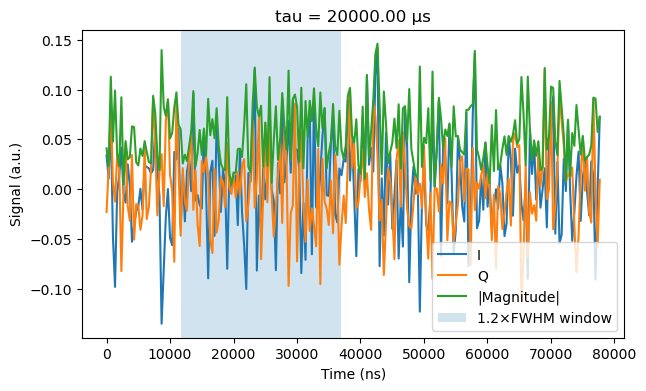

In [33]:
for i, (tau, data_int) in enumerate(zip(tau_list, data_int_list)):

    t_ns, sig = echo_data_treatment(
        data_int, 40, 300, tres=300e-9,
        baseline=True, baseline_start=-100, baseline_stop=-1,
        freq_shift=None,
        filt=True, filt_opt={'bandwidth': 3e6, 'centre': 0e6},
        ph_corr=True,
        plot=False,
        plot_dem_filt=False
    )

    mag = np.abs(sig)

    # defining fixed window from first trace
    if not window_defined:
        center_ns, fwhm_ns = estimate_center_fwhm(t_ns, mag, smooth_pts=11)
        half_width = 0.5 * 1.2 * fwhm_ns
        w0, w1 = center_ns - half_width, center_ns + half_width
        window_defined = True
        print(f"Fixed window from first trace: center={center_ns:.2f} ns, FWHM={fwhm_ns:.2f} ns,"
              f" window=[{w0:.2f}, {w1:.2f}] ns")

    # Integrating using the same widow in first trace
    mask = (t_ns >= w0) & (t_ns <= w1)
    amp_int = np.trapz(mag[mask], t_ns[mask])  # a.u. * ns
    amp_int_list.append(amp_int)

    # If tau_list is in ns: tau_us = tau/1000
    tau_us = tau  
    tau_us_list.append(tau_us)

    # plotting
    plt.figure(figsize=(7,4))
    plt.plot(t_ns, np.real(sig), label="I")
    plt.plot(t_ns, np.imag(sig), label="Q")
    plt.plot(t_ns, mag, label="|Magnitude|")

    # same window on all plots
    plt.axvspan(w0, w1, alpha=0.2, label="1.2×FWHM window")

    plt.xlabel("Time (ns)")
    plt.ylabel("Signal (a.u.)")
    plt.title(f"tau = {tau*1e-3:.2f} µs")
    plt.legend()
    plt.show()
tau_us_list = np.array(tau_us_list, dtype=float)
amp_int_list = np.array(amp_int_list, dtype=float)



## Fitting with streched exp

Fitting 25 points from t = 60.00 to 40000.00 µs

Approx. 1σ parameter uncertainties:
A     = 38783.2 ± 2.1e+03
T2    = 1517.88 ± 1.1e+02 µs
beta  = 1.79573 ± 0.31
C     = 1763.3 ± 3.7e+02


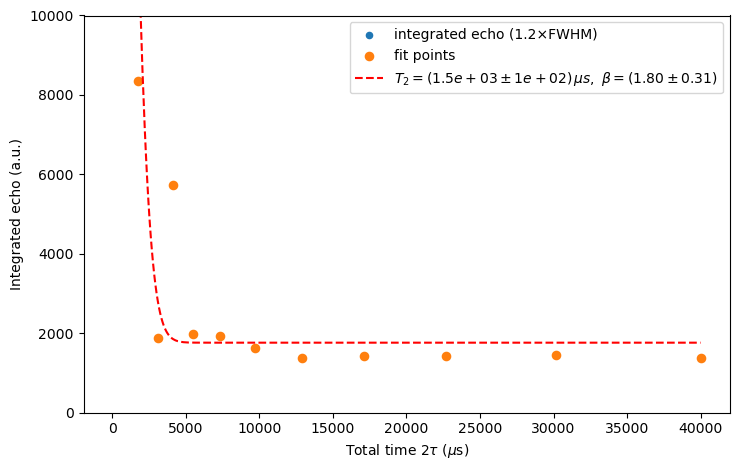

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import least_squares

def model(t, p):
    A, T2, beta, C = p
    return A * np.exp(- (t / T2)**beta) + C

def residuals(p, t, y, w):
    return w * (model(t, p) - y)

# inputs
tau_us = np.array(tau_list, dtype=float)          # tau in µs (as you said)
y      = np.array(amp_int_list, dtype=float)      # integrated 1.2×FWHM values
t_us   = 2.0 * tau_us / 1000


m = np.isfinite(t_us) & np.isfinite(y)
t_us, y = t_us[m], y[m]
order = np.argsort(t_us)
t_us, y = t_us[order], y[order]


N = len(t_us)
if N < 6:
    raise ValueError(f"Not enough points to fit (need >=6, have {N}).")

drop_start = 0         
drop_end   = 0         

i0 = drop_start
i1 = N - drop_end
t_fit = t_us[i0:i1]
y_fit = y[i0:i1]

if len(t_fit) < 6:
    raise ValueError(f"Too few points after dropping edges: {len(t_fit)}")

print(f"Fitting {len(t_fit)} points from t = {t_fit.min():.2f} to {t_fit.max():.2f} µs")


tail_n = max(3, len(y_fit)//5)
C0 = np.median(y_fit[-tail_n:])
A0 = max(np.max(y_fit) - C0, 1e-12)
T2_0 = np.median(t_fit)
beta0 = 1.2
p0 = np.array([A0, T2_0, beta0, C0], dtype=float)

lb = np.array([0.0,   max(1e-6, 0.1*t_fit.min()),  0.2,  -np.inf])
ub = np.array([np.inf, np.inf,                    3.0,   np.inf])

w = 1.0 / (np.abs(y_fit) + 0.2*np.max(np.abs(y_fit)))

res = least_squares(
    residuals, p0, bounds=(lb, ub),
    args=(t_fit, y_fit, w),
    loss="soft_l1", f_scale=1.0,
    max_nfev=200000
)

# -----------------------------
# Parameter uncertainties (approx.)
# -----------------------------
p_fit = res.x
m_fit = len(y_fit)
n_par = len(p_fit)
p_fit = res.x
A_fit, T2_fit, beta_fit, C_fit = p_fit

# Weighted residuals (what least_squares minimized)
r = residuals(p_fit, t_fit, y_fit, w)

# residual variance estimate (avoid divide-by-zero)
dof = max(1, m_fit - n_par)
s_sq = np.sum(r**2) / dof

# Covariance estimate from Jacobian
J = res.jac
JTJ = J.T @ J

# Invert robustly
try:
    cov = s_sq * np.linalg.inv(JTJ)
except np.linalg.LinAlgError:
    cov = s_sq * np.linalg.pinv(JTJ)

perr = np.sqrt(np.diag(cov))  # 1σ uncertainties

A_err, T2_err, beta_err, C_err = perr

print("\nApprox. 1σ parameter uncertainties:")
print(f"A     = {A_fit:.6g} ± {A_err:.2g}")
print(f"T2    = {T2_fit:.6g} ± {T2_err:.2g} µs")
print(f"beta  = {beta_fit:.6g} ± {beta_err:.2g}")
print(f"C     = {C_fit:.6g} ± {C_err:.2g}")


# 1σ confidence band on fitted curve (via simple Monte Carlo)

t_plot = np.linspace(t_fit.min(), t_fit.max(), 500)

# Draw parameter samples from multivariate normal
# (clip beta to bounds to avoid nonsense samples)
nsamp = 500
rng = np.random.default_rng(0)
psamp = rng.multivariate_normal(mean=p_fit, cov=cov, size=nsamp)

psamp[:, 1] = np.clip(psamp[:, 1], 1e-9, np.inf)      # T2 > 0
psamp[:, 2] = np.clip(psamp[:, 2], 0.2, 3.0)          # beta bounds

y_samp = np.array([model(t_plot, p) for p in psamp])
y_lo = np.percentile(y_samp, 16, axis=0)   # ~ -1σ
y_hi = np.percentile(y_samp, 84, axis=0)   # ~ +1σ

y_plot = model(t_plot, p_fit)

plt.figure(figsize=(7.5, 4.8))
plt.scatter(t_us, y, s=20, label="integrated echo (1.2×FWHM)")
plt.scatter(t_fit, y_fit, s=35, label="fit points")
plt.plot(
    t_plot, y_plot, "r--",
    label=rf"$T_2 = ({T2_fit:.2g}\pm{T2_err:.1g})\,\mu s,\ \beta = ({beta_fit:.2f}\pm{beta_err:.2f})$"
)


plt.xlabel(r"Total time $2\tau$ ($\mu$s)")
plt.ylabel("Integrated echo (a.u.)")
plt.legend()
plt.ylim(0,10000)
# plt.xlim(0,40000)

plt.tight_layout()
plt.show()


In [25]:
tau_vals = np.logspace(np.log10(40e3), np.log10(25000e3), 31).astype(int)

In [61]:
print("len(tau_vals)     =", len(tau_vals))
print("len(amp_int_list) =", len(amp_int_list))
print("type(amp_int_list)=", type(amp_int_list))
print("amp_int_list (first 5) =", list(amp_int_list)[:5])


len(tau_vals)     = 31
len(amp_int_list) = 0
type(amp_int_list)= <class 'numpy.ndarray'>
amp_int_list (first 5) = []


In [32]:
print("T2_fit raw =", T2_fit)
print("T2_fit scientific =", f"{T2_fit:.2g}")



T2_fit raw = 8.000000000000002
T2_fit scientific = 8


In [37]:
print(tau_list)

[   40000    49574    61440    76146    94372   116960   144955   179651
   222652   275945   341995   423853   525305   651040   806870  1000000
  1239355  1536002  1903653  2359304  2924017  3623898  4491299  5566317
  6898648  8549879 10596342 13132639 16276012 20171770 24999999]
